In [186]:
import pandas as pd
import numpy as np
import seaborn as sns
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
from scipy.spatial.distance import pdist, squareform
import community as community_louvain
from networkx.algorithms import community
import igraph as ig
from igraph import Graph, plot
import networkx as nx
import cairocffi
import igraph
#from igraph import *
import random
from scipy import stats
from scipy.stats import pearsonr, spearmanr
from scipy.cluster.hierarchy import linkage, dendrogram
from matplotlib.lines import Line2D
from PIL import Image
import itertools
from scipy.stats import pearsonr, linregress
from sklearn.manifold import MDS
from scipy.linalg import eigh
from scipy.stats import linregress, spearmanr
import matplotlib.cm as cm
from scipy.spatial.distance import pdist, squareform
from skbio.stats.ordination import pcoa

Load data

In [187]:
# otu table
ecdata = pd.read_csv("otu.csv", index_col="EC")

#DIRECTLY REMOVE SOME COLUMNS
#Identified by Deborah
columns_to_delete = ['HV_1_F', 'GN_2_F', 'SI2210715S', 'VR211015S', 'SP210924F', 'GA211029S', 'LS211029F', 'LS211029S', 'ML210924F', 'PI210924F', 'PI210924S', 'SAMD00080625', 'FE211015S', 'GA211029F', 'CF210924F', 'CG211015F', 'ac190614s', 'sa190716', 'gu190718f', 'sg190719f', 'SAMN05449943', 'SAMN05449944', 'SAMN06267146', 'SAMN05518182', 'SAMN05449942', 'SAMN06706385', 'SAMN06706403', 'SAMN06562582', 'br2_190717s', 'br1_190716s', 'sa190716', 'ep190616s']
ecdata = ecdata.drop(columns=columns_to_delete)
#CHECK THAT THEY ARE THE GOOD ONES TO REMOVE!!!!!!!!

#Identified by me
ecdata = ecdata.drop(columns=['SAMN10130915']) #weird metagenome: Contains only a few EC


#ecdata = ecdata.drop(columns=["prt_read_lenght_av"])

# pathways table
pathways_df = pd.read_csv('Carbon_EC_numbers - Pathways_overlap.csv')
ec_c_fixation_df = pathways_df[pathways_df['pathway'].isin(['3HBC', 'CBB', 'DCHB', 'HPHB', 'rTCA', 'WL'])]
ec_list = pathways_df.EC.values.flatten() #List of all C related ECs
ec_c_fixation_list = ec_c_fixation_df.EC.values.flatten() #List of C-fixation related ECs

# env table
envdata = pd.read_csv("env.csv", index_col="rowname")


Filter campaigns

In [188]:
print(envdata.shape)
print(ecdata.shape)

(298, 237)
(2716, 267)


In [189]:
#indexes_to_remove = envdata[envdata['campaign'] == "FENIX21"].index

# Remove these rows from envdata
#envdata = envdata.drop(indexes_to_remove)

# Remove columns in ecdata with names matching the saved index
#ecdata = ecdata.drop(columns=indexes_to_remove, errors='ignore')




#indexes_to_keep = envdata[envdata['campaign'].isin(["CR17", "CR18", "CR19"])].index
indexes_to_keep = envdata[envdata['campaign'].isin(["NCBI"])].index

# Keep these rows from envdata
envdata = envdata.loc[indexes_to_keep]

# Keep columns in ecdata with names matching the saved index (also keep "prt_read_lenght_av")
ecdata = ecdata.loc[:, ecdata.columns.isin(indexes_to_keep.union(["prt_read_lenght_av"]))]



In [190]:
print(envdata.shape)
print(ecdata.shape)

(145, 237)
(2716, 136)



#ADDED on 20241010: i joint the otu from Fullerton
ecdata_fullerton = pd.read_csv("mifaser_dataset_from_Fullerton.csv", index_col="EC").drop(ecdata_fullerton.columns[0], axis=1)
merged_df = pd.concat([ecdata, ecdata_fullerton], axis=1, join='outer')
ecdata = merged_df

Prevalence analysis (first with sum of abundance / second with mean abundance)

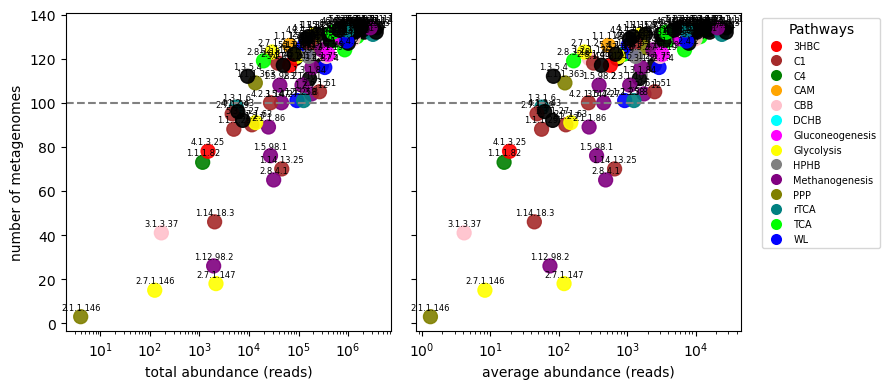

In [191]:
tested_df = ecdata.loc[ecdata.index.isin(ec_list)]
tested_df = tested_df.drop(columns=["prt_read_lenght_av"])

# Calculate prevalence
prevalence = (tested_df > 0).sum(axis=1)

# Calculate average and sum of abundances
filtered_ecdata = tested_df[tested_df > 0]
average_abundance = filtered_ecdata.sum(axis=1) / filtered_ecdata.count(axis=1)
sum_abundance = filtered_ecdata.sum(axis=1)

# Define a specific color for each pathway
pathway_colors = {
    '3HBC': 'red',
    'C1': 'brown',
    'C4': 'green',
    'CAM': 'orange',
    'CBB': 'pink',
    'DCHB': 'cyan',
    'Gluconeogenesis': 'magenta',
    'Glycolysis': 'yellow',
    'HPHB': 'gray',
    'Methanogenesis': 'purple',
    'PPP': 'olive',
    'rTCA': 'teal',
    'TCA': 'lime',
    'WL': 'blue'
}

# Create a dictionary to map EC numbers to colors
ec_to_pathway = pathways_df.groupby('EC')['pathway'].apply(lambda x: '/'.join(x))
ec_to_color = {ec: 'black' if len(pathways.split('/')) > 1 else pathway_colors.get(pathways.split('/')[0], 'black')
               for ec, pathways in ec_to_pathway.items()}

# Map EC numbers to colors
colors = [ec_to_color.get(ec, 'black') for ec in tested_df.index]

# Create the figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4))

# Plot 1: Average abundance
scatter1 = ax1.scatter(sum_abundance, prevalence, c=colors, alpha=.9, s=100)
ax1.axhline(y=100, color='gray', linestyle='--')
ax1.set_xlabel('total abundance (reads)')
ax1.set_xscale('log')
ax1.set_ylabel('number of metagenomes')

# Plot 2: Sum of abundances
scatter2 = ax2.scatter(average_abundance, prevalence, c=colors, alpha=.9, s=100)
ax2.axhline(y=100, color='gray', linestyle='--')
ax2.set_xlabel('average abundance (reads)')
ax2.set_xscale('log')
ax2.set_yticklabels([])
#ax2.set_ylabel('number of metagenomes')

# Add legend to the second plot
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=9, linestyle='') 
           for color in pathway_colors.values()]
ax2.legend(handles, pathway_colors.keys(), title='Pathways', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=7)

# Annotate dots with EC numbers on both plots
for i, (x, y, ec) in enumerate(zip(sum_abundance, prevalence, tested_df.index)):
    ax1.annotate(ec, (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=6)

for i, (x, y, ec) in enumerate(zip(average_abundance, prevalence, tested_df.index)):
    ax2.annotate(ec, (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=6)

plt.tight_layout()
plt.show()

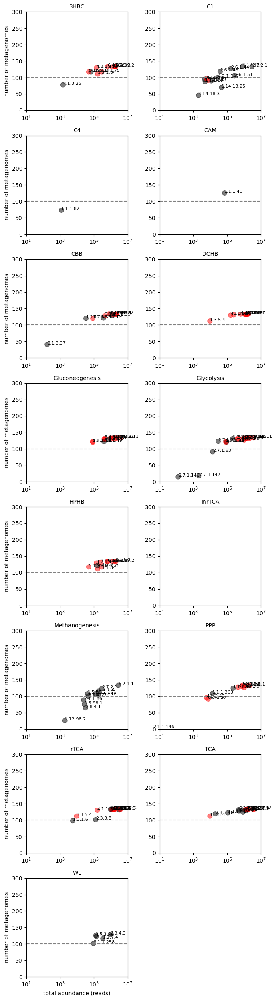

In [192]:
# Merge ecdata with pathways_df based on EC numbers
merged_df = pd.merge(pathways_df, ecdata, left_on='EC', right_index=True, how='right')
merged_df = merged_df.drop(columns=["prt_read_lenght_av"])

# Group by pathways
grouped_pathways = merged_df.groupby('pathway')

# Check if any EC is in more than one pathway
ec_in_multiple_pathways = pathways_df.groupby('EC').filter(lambda x: len(x) > 1)['EC'].unique()

fig, axes = plt.subplots(8, 2, figsize=(7, 25)) 
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Get all pathways
all_pathways = pathways_df['pathway'].unique()

# Loop through each pathway (including empty pathways) and create the plot
for idx, (ax, pathway) in enumerate(zip(axes, all_pathways)):
    if pathway in grouped_pathways.groups:
        group = grouped_pathways.get_group(pathway)

        # Drop 'pathway' and 'EC' columns to get only abundance data
        abundance_data = group.drop(columns=['pathway', 'EC'])

        # Ensure only numeric columns are selected (abundance data should be numeric)
        abundance_data = abundance_data.apply(pd.to_numeric, errors='coerce')

        # Calculate the prevalence (number of metagenomes where abundance > 0) for each EC number
        prevalence = (abundance_data > 0).sum(axis=1)

        # Calculate the total abundance for each EC number
        total_abundance = abundance_data.sum(axis=1)

        # Plotting with special color for EC numbers in multiple pathways
        colors = ['red' if ec in ec_in_multiple_pathways else 'black' for ec in group['EC']]
        ax.scatter(total_abundance, prevalence, color=colors, alpha=0.5, s=70)

        ax.axhline(y=100, color='gray', linestyle='--')

        # Add EC numbers as text labels next to each point
        for i, ec_number in enumerate(group['EC']):
            ax.text(total_abundance.iloc[i], prevalence.iloc[i], ec_number, fontsize=8)

    ax.set_title(f'{pathway}', fontsize=10)
    ax.grid(False)
    ax.set_xscale('log')
    ax.set_xlim(10, 10**7)
    ax.set_ylim(0, 300)

    # Set labels for only the outermost plots
    if idx % 2 == 0:  # First column
        ax.set_ylabel('number of metagenomes')
    if idx >= 14:  # Last row
        ax.set_xlabel('total abundance (reads)')

# Add empty plots if needed for pathways without EC numbers in the OTU table
for i in range(len(all_pathways), len(axes)):
    axes[i].axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
#plt.savefig('prevalence_anal_total.png', dpi=300)

plt.show()


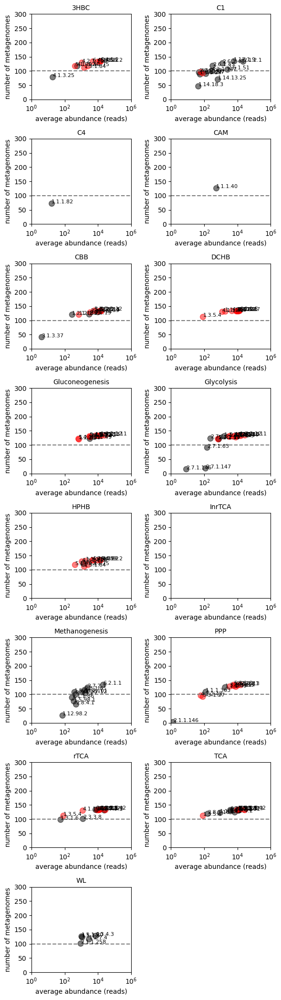

In [193]:
# Merge ecdata with pathways_df based on EC numbers
merged_df = pd.merge(pathways_df, ecdata, left_on='EC', right_index=True, how='right')
merged_df = merged_df.drop(columns=["prt_read_lenght_av"])

# Group by pathways
grouped_pathways = merged_df.groupby('pathway')

# Check if any EC is in more than one pathway
ec_in_multiple_pathways = pathways_df.groupby('EC').filter(lambda x: len(x) > 1)['EC'].unique()

# Set up a 7x2 grid for the subplots
fig, axes = plt.subplots(8, 2, figsize=(6, 21))  # 7 rows, 2 columns
axes = axes.flatten()  # Flatten the axes array for easy iteration

# Get all pathways
all_pathways = pathways_df['pathway'].unique()

# Loop through each pathway (including empty pathways) and create the plot
for ax, pathway in zip(axes, all_pathways):
    if pathway in grouped_pathways.groups:
        group = grouped_pathways.get_group(pathway)

        # Drop 'pathway' and 'EC' columns to get only abundance data
        abundance_data = group.drop(columns=['pathway', 'EC'])

        # Ensure only numeric columns are selected (abundance data should be numeric)
        abundance_data = abundance_data.apply(pd.to_numeric, errors='coerce')

        # Calculate the prevalence (number of metagenomes where abundance > 0) for each EC number
        prevalence = (abundance_data > 0).sum(axis=1)

        # Calculate the total abundance for each EC number
        total_abundance = abundance_data.mean(axis=1)

        # Plotting with special color for EC numbers in multiple pathways
        colors = ['red' if ec in ec_in_multiple_pathways else 'black' for ec in group['EC']]
        ax.scatter(total_abundance, prevalence, color=colors, alpha = .5, s=70)

        ax.axhline(y=100, color='gray', linestyle='--')

        # Add EC numbers as text labels next to each point
        for i, ec_number in enumerate(group['EC']):
            ax.text(total_abundance.iloc[i], prevalence.iloc[i], ec_number, fontsize=8)

    ax.set_title(f'{pathway}', fontsize=10)
    ax.grid(False)
    ax.set_xscale('log')
    ax.set_xlim(1, 10**6)
    ax.set_ylim(0, 300)

    # Set labels for only the outermost plots
    if idx % 2 == 0:  # First column
        ax.set_ylabel('number of metagenomes')
    if idx >= 14:  # Last row
        ax.set_xlabel('average abundance (reads)')

# Add empty plots if needed for pathways without EC numbers in the OTU table
for i in range(len(all_pathways), len(axes)):
    axes[i].axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
#plt.savefig('prevalence_anal_avg.png', dpi=300)

plt.show()


In [194]:
ecdata

,prt_read_lenght_av,SAMD00080626,SAMD00080627,SAMD00080628,SAMD00155365,SAMD00155369,SAMD00155372,SAMN02419148,SAMN02419149,SAMN02419150,...,SAMN14653546,SAMN14653547,SAMN14653548,SAMN14653549,SAMN14653552,SAMN14653553,SAMN14653554,SAMN14653555,SAMN14653556,SAMN14653557
EC,,,,,,,,,,,,,,,,,,,,,
1.1.1.1,374.595238,127.0,830.0,774.0,248.0,1038.0,4496.0,26.0,1051.0,2705.0,...,1967.0,1125.0,799.0,4804.0,1395.0,407.0,491.0,1088.0,1960.0,567.0
1.1.1.10,253.000000,3.0,19.0,14.0,1.0,21.0,4.0,NaN,11.0,15.0,...,40.0,24.0,25.0,9.0,28.0,1.0,5.0,39.0,44.0,7.0
1.1.1.100,696.456140,1127.0,5940.0,7166.0,17250.0,1633.0,6483.0,1267.0,44606.0,44196.0,...,12076.0,6783.0,4983.0,9983.0,6694.0,2111.0,11532.0,9093.0,8131.0,4254.0
1.1.1.103,339.750000,245.0,1658.0,1868.0,1.0,8.0,123.0,110.0,2741.0,5460.0,...,2533.0,1344.0,1234.0,390.0,991.0,975.0,356.0,3007.0,1561.0,931.0
1.1.1.107,248.000000,5.0,43.0,24.0,NaN,2.0,2.0,6.0,99.0,180.0,...,77.0,112.0,60.0,27.0,68.0,8.0,19.0,162.0,75.0,34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7.5.2.8,324.714286,11.0,30.0,86.0,NaN,NaN,7.0,1.0,128.0,691.0,...,394.0,295.0,331.0,94.0,186.0,23.0,81.0,287.0,451.0,269.0
7.6.2.1,816.555556,74.0,353.0,335.0,695.0,25.0,71.0,59.0,2059.0,3204.0,...,655.0,389.0,349.0,360.0,420.0,88.0,231.0,553.0,383.0,179.0
7.6.2.2,938.000000,322.0,1927.0,1898.0,5.0,69.0,698.0,248.0,5091.0,5031.0,...,2576.0,998.0,871.0,512.0,998.0,354.0,1655.0,1659.0,1267.0,516.0


In [195]:
#fill NaN values with 0 (or lowest value)
#ecdata = ecdata.fillna(0)
#ecdata.fillna(ecdata.min().min(), inplace=True)


In [196]:
ecdata

,prt_read_lenght_av,SAMD00080626,SAMD00080627,SAMD00080628,SAMD00155365,SAMD00155369,SAMD00155372,SAMN02419148,SAMN02419149,SAMN02419150,...,SAMN14653546,SAMN14653547,SAMN14653548,SAMN14653549,SAMN14653552,SAMN14653553,SAMN14653554,SAMN14653555,SAMN14653556,SAMN14653557
EC,,,,,,,,,,,,,,,,,,,,,
1.1.1.1,374.595238,127.0,830.0,774.0,248.0,1038.0,4496.0,26.0,1051.0,2705.0,...,1967.0,1125.0,799.0,4804.0,1395.0,407.0,491.0,1088.0,1960.0,567.0
1.1.1.10,253.000000,3.0,19.0,14.0,1.0,21.0,4.0,NaN,11.0,15.0,...,40.0,24.0,25.0,9.0,28.0,1.0,5.0,39.0,44.0,7.0
1.1.1.100,696.456140,1127.0,5940.0,7166.0,17250.0,1633.0,6483.0,1267.0,44606.0,44196.0,...,12076.0,6783.0,4983.0,9983.0,6694.0,2111.0,11532.0,9093.0,8131.0,4254.0
1.1.1.103,339.750000,245.0,1658.0,1868.0,1.0,8.0,123.0,110.0,2741.0,5460.0,...,2533.0,1344.0,1234.0,390.0,991.0,975.0,356.0,3007.0,1561.0,931.0
1.1.1.107,248.000000,5.0,43.0,24.0,NaN,2.0,2.0,6.0,99.0,180.0,...,77.0,112.0,60.0,27.0,68.0,8.0,19.0,162.0,75.0,34.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7.5.2.8,324.714286,11.0,30.0,86.0,NaN,NaN,7.0,1.0,128.0,691.0,...,394.0,295.0,331.0,94.0,186.0,23.0,81.0,287.0,451.0,269.0
7.6.2.1,816.555556,74.0,353.0,335.0,695.0,25.0,71.0,59.0,2059.0,3204.0,...,655.0,389.0,349.0,360.0,420.0,88.0,231.0,553.0,383.0,179.0
7.6.2.2,938.000000,322.0,1927.0,1898.0,5.0,69.0,698.0,248.0,5091.0,5031.0,...,2576.0,998.0,871.0,512.0,998.0,354.0,1655.0,1659.0,1267.0,516.0


In [197]:
#Filter only C genes from the begining 
#rpo = ecdata.loc["2.7.7.6",:] #in case you need to add it for normalization after filtering
#ecdata = ecdata.loc[ecdata.index.isin(ec_list)]
#ecdata = ecdata.loc[ecdata.index.isin(ec_c_fixation_list)]

Normalization

In [198]:
# Normalization by prt_read_lenght_av and then by col_sum
ecdata_n_readlength = ecdata.div(ecdata.prt_read_lenght_av, axis=0)
ecdata_n_readlength = ecdata_n_readlength.apply(lambda x: (x / x.sum(skipna=True)), axis=0)
ecdata_n_readlength = ecdata_n_readlength.drop(columns=["prt_read_lenght_av"])

# Additional normalization by rpo
ecdata_n_readlength_with_rpo = ecdata_n_readlength.loc[:, ecdata.loc["2.7.7.6"] != 0]
ecdata_n_readlength_rpo = ecdata_n_readlength_with_rpo.div(ecdata_n_readlength_with_rpo.loc["2.7.7.6"], axis=1)

# Now that we used it, we can remove "prt_read_lenght_av" col for good in ecdata
ecdata = ecdata.drop(columns=["prt_read_lenght_av"])

# Simple normalization by col_sum
ecdata_n = ecdata.apply(lambda x: (x / x.sum(skipna=True)), axis=0)

# Simple normalization by rpo
ecdata_with_rpo = ecdata.loc[:, ecdata.loc["2.7.7.6"] != 0] # Remove columns where ecdata.loc["2.7.7.6"] == 0 (these ones had NaN for rpo...)
ecdata_n_rpo = ecdata_with_rpo.div(ecdata_with_rpo.loc["2.7.7.6"], axis=1)
#ecdata_n_rpo = ecdata.loc[:, rpo != 0] / rpo[rpo != 0] # IN CASE YOU FILTERED OUT RPO PREVIOUSLY BUT INTRODUCED rpo BEFORE



Select only carbon associated genes

In [199]:

dataset_carbon = ecdata.loc[ecdata.index.isin(ec_list)]
dataset_carbon_n = ecdata_n.loc[ecdata_n.index.isin(ec_list)]
dataset_carbon_n_rpo = ecdata_n_rpo.loc[ecdata_n_rpo.index.isin(ec_list)]
dataset_carbon_n_readlength = ecdata_n_readlength.loc[ecdata_n_readlength.index.isin(ec_list)]
dataset_carbon_n_readlength_rpo = ecdata_n_readlength_rpo.loc[ecdata_n_readlength_rpo.index.isin(ec_list)]

# Select only carbon fixation pathways genes
#dataset_carbon = ecdata.loc[ecdata.index.isin(ec_c_fixation_list)]
#dataset_carbon_n = ecdata_n.loc[ecdata_n.index.isin(ec_c_fixation_list)]
#dataset_carbon_n_rpo = ecdata_n_rpo.loc[ecdata_n_rpo.index.isin(ec_c_fixation_list)]
#dataset_carbon_n_readlength = ecdata_n_readlength.loc[ecdata_n_readlength.index.isin(ec_c_fixation_list)]
#dataset_carbon_n_readlength_rpo = ecdata_n_readlength_rpo.loc[ecdata_n_readlength_rpo.index.isin(ec_c_fixation_list)]


Delete EC identified in the prevalence analysis

In [200]:
# List of indexes to remove
indexes_to_remove = ["2.7.1.146", "2.7.1.147", "1.12.98.2", "2.1.1.146"]

# Remove the rows with the specified indexes
dataset_carbon = dataset_carbon.drop(index=indexes_to_remove)
dataset_carbon_n = dataset_carbon_n.drop(index=indexes_to_remove)
dataset_carbon_n_rpo = dataset_carbon_n_rpo.drop(index=indexes_to_remove)
dataset_carbon_n_readlength = dataset_carbon_n_readlength.drop(index=indexes_to_remove)
dataset_carbon_n_readlength_rpo = dataset_carbon_n_readlength_rpo.drop(index=indexes_to_remove)


In [201]:
dataset_carbon

,SAMD00080626,SAMD00080627,SAMD00080628,SAMD00155365,SAMD00155369,SAMD00155372,SAMN02419148,SAMN02419149,SAMN02419150,SAMN02743532,...,SAMN14653546,SAMN14653547,SAMN14653548,SAMN14653549,SAMN14653552,SAMN14653553,SAMN14653554,SAMN14653555,SAMN14653556,SAMN14653557
EC,,,,,,,,,,,,,,,,,,,,,
1.1.1.27,23.0,203.0,158.0,1926.0,38.0,10.0,95.0,1458.0,669.0,547.0,...,323.0,393.0,508.0,94.0,595.0,187.0,109.0,769.0,507.0,633.0
1.1.1.29,NaN,68.0,6.0,NaN,NaN,NaN,1.0,5.0,5.0,NaN,...,27.0,9.0,15.0,5.0,12.0,NaN,16.0,28.0,20.0,1.0
1.1.1.35,78.0,973.0,473.0,5.0,200.0,718.0,34.0,2018.0,3200.0,226.0,...,2742.0,1054.0,855.0,1878.0,1221.0,254.0,7735.0,1242.0,1650.0,548.0
1.1.1.363,4.0,39.0,23.0,NaN,NaN,4.0,11.0,342.0,121.0,26.0,...,49.0,65.0,39.0,20.0,77.0,15.0,75.0,26.0,76.0,43.0
1.1.1.37,636.0,3428.0,4009.0,5712.0,1566.0,8661.0,1000.0,37380.0,40996.0,9337.0,...,8695.0,3755.0,3179.0,3790.0,4093.0,1709.0,5281.0,5981.0,4836.0,4541.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6.2.1.5,309.0,3029.0,2054.0,46000.0,21910.0,7221.0,1247.0,55892.0,52011.0,36618.0,...,9366.0,4191.0,3406.0,6739.0,3644.0,1355.0,6830.0,6344.0,5476.0,6044.0
6.3.4.3,812.0,3723.0,5012.0,2.0,NaN,581.0,452.0,10498.0,14559.0,466.0,...,4027.0,4359.0,3452.0,1022.0,3156.0,1426.0,970.0,7820.0,2907.0,2338.0
6.4.1.1,118.0,1082.0,664.0,35541.0,1780.0,969.0,271.0,9742.0,23459.0,68404.0,...,3509.0,1716.0,1598.0,1827.0,2094.0,720.0,882.0,2917.0,3143.0,2465.0


Repeat prevalence analysis (for all 5 datasets)

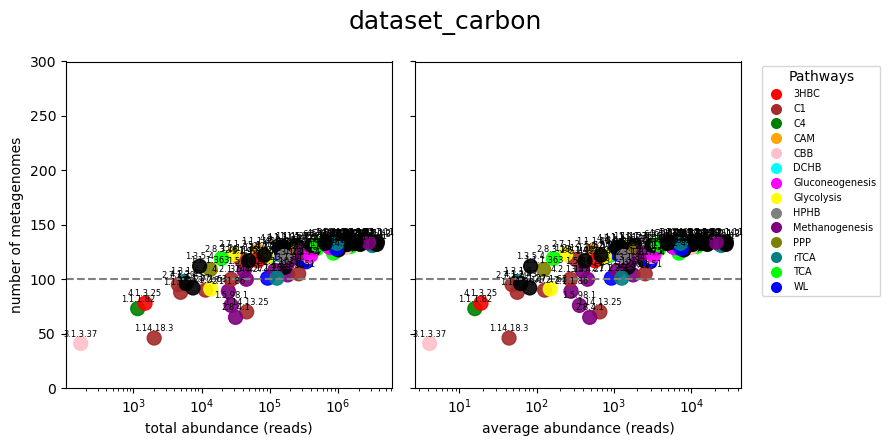

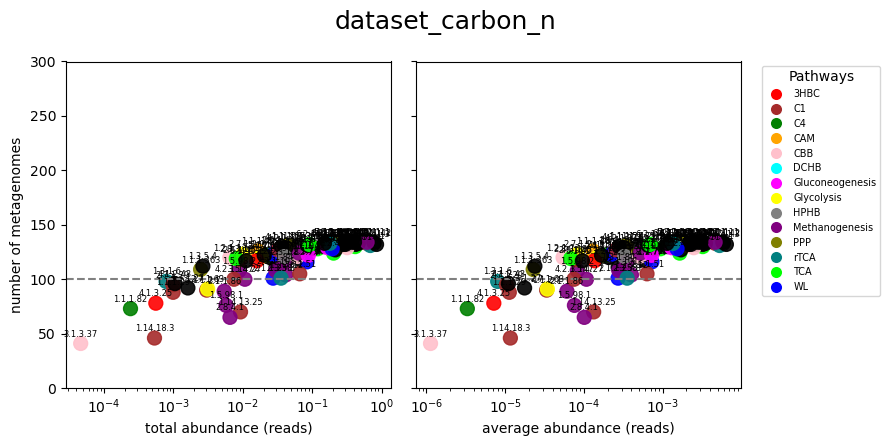

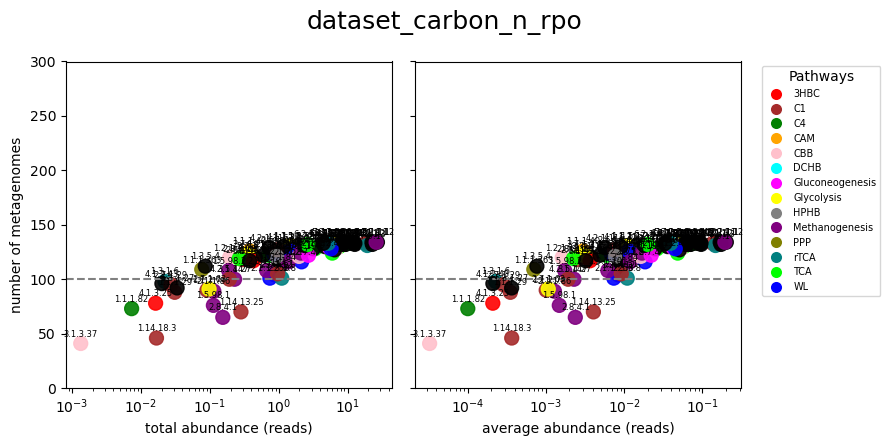

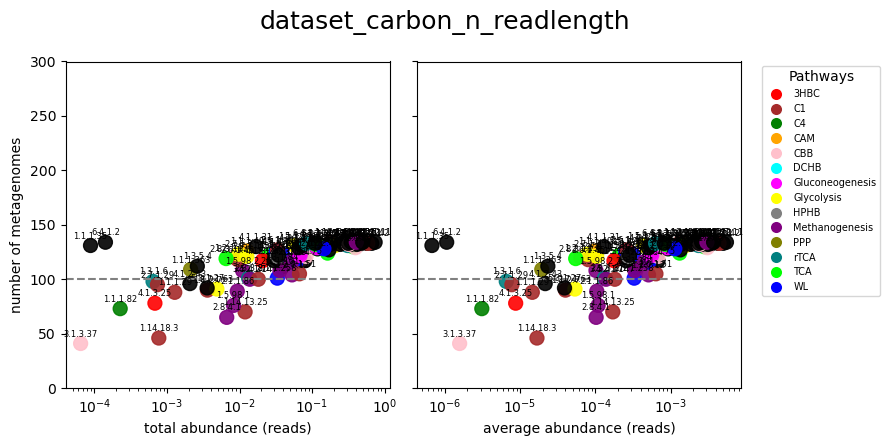

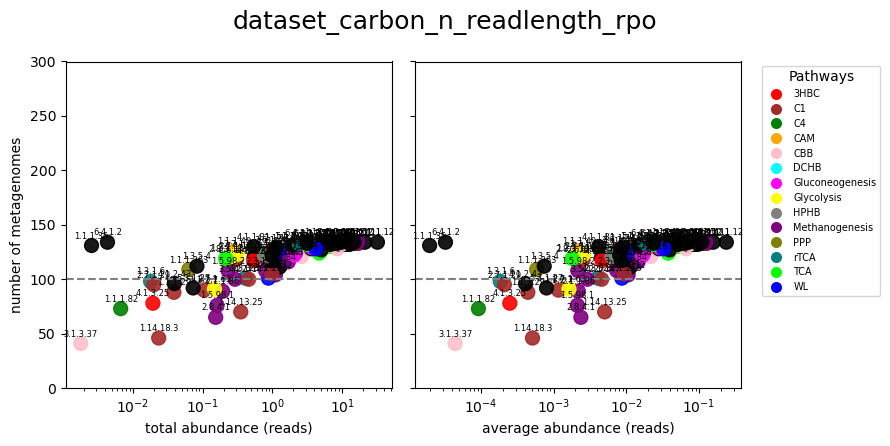

In [202]:
dataset_names = ['dataset_carbon', 'dataset_carbon_n', 'dataset_carbon_n_rpo', 'dataset_carbon_n_readlength', 'dataset_carbon_n_readlength_rpo']

# Loop through the datasets along with their names
for tested_df, dataset_name in zip([dataset_carbon, dataset_carbon_n, dataset_carbon_n_rpo, dataset_carbon_n_readlength, dataset_carbon_n_readlength_rpo], dataset_names):

    # Calculate prevalence
    prevalence = (tested_df > 0).sum(axis=1)

    # Calculate average and sum of abundances
    filtered_ecdata = tested_df[tested_df > 0]
    average_abundance = filtered_ecdata.sum(axis=1) / filtered_ecdata.count(axis=1)
    sum_abundance = filtered_ecdata.sum(axis=1)

    # Define a specific color for each pathway
    pathway_colors = {
        '3HBC': 'red',
        'C1': 'brown',
        'C4': 'green',
        'CAM': 'orange',
        'CBB': 'pink',
        'DCHB': 'cyan',
        'Gluconeogenesis': 'magenta',
        'Glycolysis': 'yellow',
        'HPHB': 'gray',
        'Methanogenesis': 'purple',
        'PPP': 'olive',
        'rTCA': 'teal',
        'TCA': 'lime',
        'WL': 'blue'
    }

    # Create a dictionary to map EC numbers to colors
    ec_to_pathway = pathways_df.groupby('EC')['pathway'].apply(lambda x: '/'.join(x))
    ec_to_color = {ec: 'black' if len(pathways.split('/')) > 1 else pathway_colors.get(pathways.split('/')[0], 'black')
                for ec, pathways in ec_to_pathway.items()}

    # Map EC numbers to colors
    colors = [ec_to_color.get(ec, 'black') for ec in tested_df.index]

    # Create the figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4.5))

    # Plot 1: Average abundance
    scatter1 = ax1.scatter(sum_abundance, prevalence, c=colors, alpha=.9, s=100)
    ax1.axhline(y=100, color='gray', linestyle='--')
    ax1.set_xlabel('total abundance (reads)')
    ax1.set_xscale('log')
    ax1.set_ylabel('number of metagenomes')

    # Plot 2: Sum of abundances
    scatter2 = ax2.scatter(average_abundance, prevalence, c=colors, alpha=.9, s=100)
    ax2.axhline(y=100, color='gray', linestyle='--')
    ax2.set_xlabel('average abundance (reads)')
    ax2.set_xscale('log')
    ax2.set_yticklabels([])
    #ax2.set_ylabel('number of metagenomes')
    ax1.set_ylim(0, 300)
    ax2.set_ylim(0, 300)

    # Add legend to the second plot
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=9, linestyle='') 
            for color in pathway_colors.values()]
    ax2.legend(handles, pathway_colors.keys(), title='Pathways', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=7)

    # Annotate dots with EC numbers on both plots
    for i, (x, y, ec) in enumerate(zip(sum_abundance, prevalence, tested_df.index)):
        ax1.annotate(ec, (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=6)

    for i, (x, y, ec) in enumerate(zip(average_abundance, prevalence, tested_df.index)):
        ax2.annotate(ec, (x, y), textcoords="offset points", xytext=(0,5), ha='center', fontsize=6)
    
    fig.suptitle(f"{dataset_name}", fontsize=18)

    plt.tight_layout()
    plt.show()


### PCoA / nMDS of all samples

All C-related genes

/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:146: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.06645013734984251 and the largest is 3.1816334026610935.
  warn(


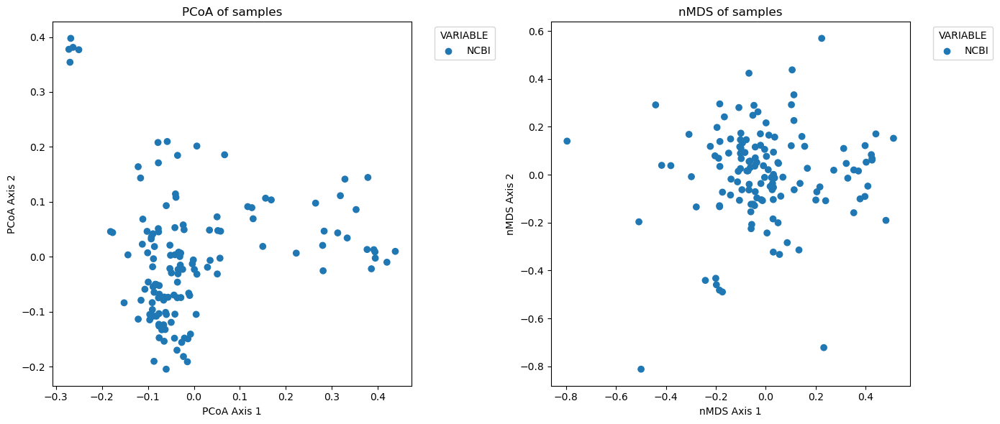

In [203]:
USE_ALL_DATA = True
DATASET = dataset_carbon_n
VARIABLE = "campaign"

# Filtering the data to include only carbon fixation pathways (CFP) if needed
dataset_filtered = DATASET[DATASET.index.isin(ec_c_fixation_list)] if not USE_ALL_DATA else DATASET

# Replace NaN values with 0 (or another approach if needed)
dataset_filtered = dataset_filtered.fillna(0)

# Drop rows/columns that are all zeros
dataset_filtered = dataset_filtered.loc[(dataset_filtered != 0).any(axis=1)]
dataset_filtered = dataset_filtered.loc[:, (dataset_filtered != 0).any(axis=0)]

# Transpose the DataFrame: samples as rows and EC numbers as columns
data_transposed = dataset_filtered.T

# Compute Bray-Curtis distance matrix
distance_matrix = pdist(data_transposed, metric='braycurtis')

# Convert distance matrix to square form for PCoA
distance_square = squareform(distance_matrix)

# Perform PCoA
pcoa_results = pcoa(distance_square)

# Extract the PCoA coordinates for the first two axes
pcoa_coords = pcoa_results.samples
pcoa1 = pcoa_coords.iloc[:, 0]
pcoa2 = pcoa_coords.iloc[:, 1]

# Perform nMDS using Bray-Curtis distance
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
mds_coords = mds.fit_transform(distance_square)

# Extract nMDS coordinates
mds1 = mds_coords[:, 0]
mds2 = mds_coords[:, 1]

# Map colors to values in the VARIABLE column
unique_values = envdata[VARIABLE].unique()
color_map = {value: color for value, color in zip(unique_values, plt.cm.tab10.colors[:len(unique_values)])}
sample_colors = [color_map[envdata.loc[sample, VARIABLE]] for sample in data_transposed.index]

# Plot the PCoA and nMDS results side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# PCoA plot
axs[0].scatter(pcoa1, pcoa2, c=sample_colors)
for value, color in color_map.items(): 
    axs[0].scatter([], [], color=color, label=value)  # Dummy scatter for legend
axs[0].legend(title='VARIABLE', bbox_to_anchor=(1.05, 1), loc='upper left')
axs[0].set_title('PCoA of samples')
axs[0].set_xlabel('PCoA Axis 1')
axs[0].set_ylabel('PCoA Axis 2')

# nMDS plot
axs[1].scatter(mds1, mds2, c=sample_colors)
for value, color in color_map.items(): 
    axs[1].scatter([], [], color=color, label=value)  # Dummy scatter for legend
axs[1].legend(title='VARIABLE', bbox_to_anchor=(1.05, 1), loc='upper left')
axs[1].set_title('nMDS of samples')
axs[1].set_xlabel('nMDS Axis 1')
axs[1].set_ylabel('nMDS Axis 2')

plt.tight_layout()
plt.show()

Only CFP genes

/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:146: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.10475144051397267 and the largest is 2.8616371950184196.
  warn(


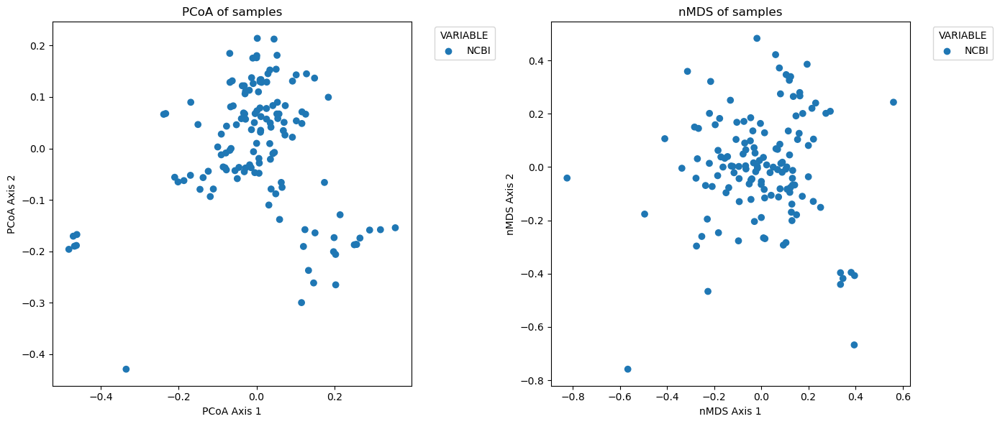

In [204]:
USE_ALL_DATA = False
DATASET = dataset_carbon_n
VARIABLE = "campaign"

# Filtering the data to include only carbon fixation pathways (CFP) if needed
dataset_filtered = DATASET[DATASET.index.isin(ec_c_fixation_list)] if not USE_ALL_DATA else DATASET

# Replace NaN values with 0 (or another approach if needed)
dataset_filtered = dataset_filtered.fillna(0)

# Drop rows/columns that are all zeros
dataset_filtered = dataset_filtered.loc[(dataset_filtered != 0).any(axis=1)]
dataset_filtered = dataset_filtered.loc[:, (dataset_filtered != 0).any(axis=0)]

# Transpose the DataFrame: samples as rows and EC numbers as columns
data_transposed = dataset_filtered.T

# Compute Bray-Curtis distance matrix
distance_matrix = pdist(data_transposed, metric='braycurtis')

# Convert distance matrix to square form for PCoA
distance_square = squareform(distance_matrix)

# Perform PCoA
pcoa_results = pcoa(distance_square)

# Extract the PCoA coordinates for the first two axes
pcoa_coords = pcoa_results.samples
pcoa1 = pcoa_coords.iloc[:, 0]
pcoa2 = pcoa_coords.iloc[:, 1]

# Perform nMDS using Bray-Curtis distance
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
mds_coords = mds.fit_transform(distance_square)

# Extract nMDS coordinates
mds1 = mds_coords[:, 0]
mds2 = mds_coords[:, 1]

# Map colors to values in the VARIABLE column
unique_values = envdata[VARIABLE].unique()
color_map = {value: color for value, color in zip(unique_values, plt.cm.tab10.colors[:len(unique_values)])}
sample_colors = [color_map[envdata.loc[sample, VARIABLE]] for sample in data_transposed.index]

# Plot the PCoA and nMDS results side by side
fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# PCoA plot
axs[0].scatter(pcoa1, pcoa2, c=sample_colors)
for value, color in color_map.items(): 
    axs[0].scatter([], [], color=color, label=value)  # Dummy scatter for legend
axs[0].legend(title='VARIABLE', bbox_to_anchor=(1.05, 1), loc='upper left')
axs[0].set_title('PCoA of samples')
axs[0].set_xlabel('PCoA Axis 1')
axs[0].set_ylabel('PCoA Axis 2')

# nMDS plot
axs[1].scatter(mds1, mds2, c=sample_colors)
for value, color in color_map.items(): 
    axs[1].scatter([], [], color=color, label=value)  # Dummy scatter for legend
axs[1].legend(title='VARIABLE', bbox_to_anchor=(1.05, 1), loc='upper left')
axs[1].set_title('nMDS of samples')
axs[1].set_xlabel('nMDS Axis 1')
axs[1].set_ylabel('nMDS Axis 2')

plt.tight_layout()
plt.show()

### PCoA / nMDS of ECs

All C-related genes

/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:146: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.07820577478851538 and the largest is 8.875683555300208.
  warn(


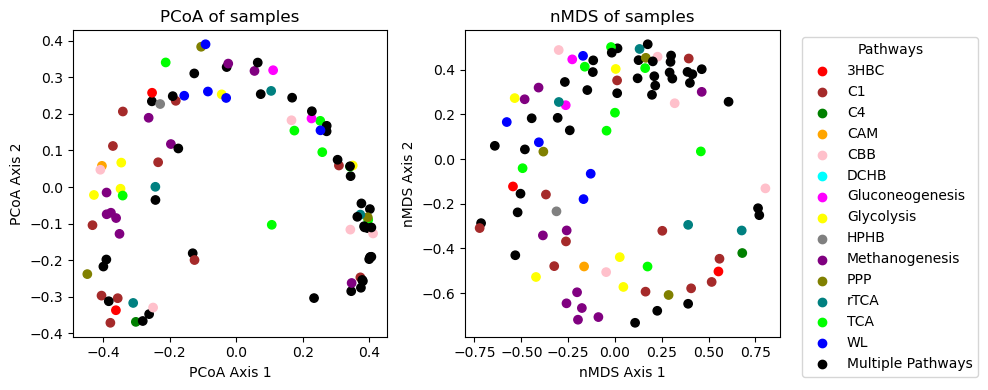

In [205]:
USE_ALL_DATA = True
DATASET = dataset_carbon_n_readlength_rpo


# Filtering the data to include only carbon fixation pathways (CFP) if needed
dataset_filtered = DATASET[DATASET.index.isin(ec_c_fixation_list)] if not USE_ALL_DATA else DATASET

# Replace NaN values with 0 (or another approach if needed)
dataset_filtered = dataset_filtered.fillna(0)

# Drop rows/columns that are all zeros
dataset_filtered = dataset_filtered.loc[(dataset_filtered != 0).any(axis=1)]
dataset_filtered = dataset_filtered.loc[:, (dataset_filtered != 0).any(axis=0)]



# Compute Bray-Curtis distance matrix
distance_matrix = pdist(dataset_filtered, metric='braycurtis')

# Convert distance matrix to square form for PCoA
distance_square = squareform(distance_matrix)

# Perform PCoA
pcoa_results = pcoa(distance_square)

# Extract the PCoA coordinates for the first two axes
pcoa_coords = pcoa_results.samples
pcoa1 = pcoa_coords.iloc[:, 0]
pcoa2 = pcoa_coords.iloc[:, 1]

# Perform nMDS using Bray-Curtis distance
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
mds_coords = mds.fit_transform(distance_square)

# Extract nMDS coordinates
mds1 = mds_coords[:, 0]
mds2 = mds_coords[:, 1]



ec_to_pathway = pathways_df.groupby('EC')['pathway'].apply(lambda x: '/'.join(x))

ec_to_color = {
    ec: 'black' if len(pathways.split('/')) > 1 
    else pathway_colors.get(pathways.split('/')[0], 'gray')
    for ec, pathways in ec_to_pathway.items()
}
# For each EC number, assign the color based on its pathway
sample_colors = [ec_to_color.get(ec, 'gray') for ec in dataset_filtered.index]







# Plot the PCoA and nMDS results side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# PCoA plot
axs[0].scatter(pcoa1, pcoa2, c=sample_colors)
axs[0].set_title('PCoA of samples')
axs[0].set_xlabel('PCoA Axis 1')
axs[0].set_ylabel('PCoA Axis 2')

# nMDS plot
axs[1].scatter(mds1, mds2, c=sample_colors)

#legend
for pathway, color in pathway_colors.items():
    plt.scatter([], [], c=color, label=pathway)  # Empty scatter for legend entry
plt.scatter([], [], c='black', label='Multiple Pathways')  # Special case for ECs with multiple pathways
plt.legend(title="Pathways", bbox_to_anchor=(1.05, 1), loc='upper left')


axs[1].set_title('nMDS of samples')
axs[1].set_xlabel('nMDS Axis 1')
axs[1].set_ylabel('nMDS Axis 2')

plt.tight_layout()
plt.show()

Only CFP genes

/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:146: RuntimeWarning: The result contains negative eigenvalues. Please compare their magnitude with the magnitude of some of the largest positive eigenvalues. If the negative ones are smaller, it's probably safe to ignore them, but if they are large in magnitude, the results won't be useful. See the Notes section for more details. The smallest eigenvalue is -0.026187536576311315 and the largest is 4.056657763142503.
  warn(


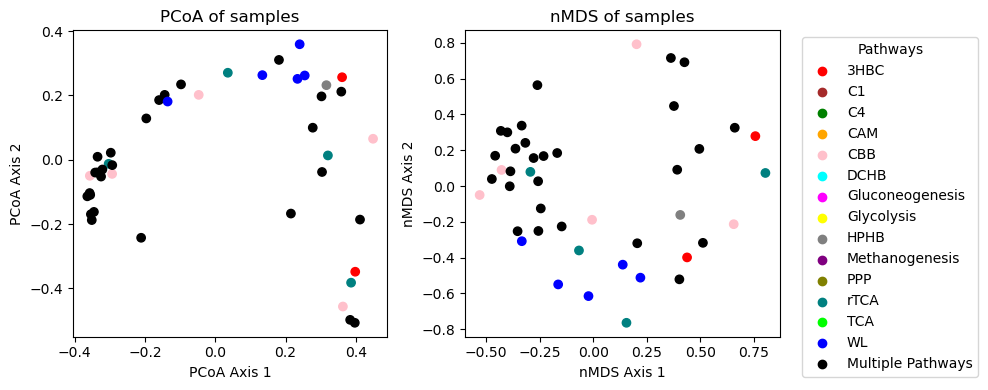

In [206]:
USE_ALL_DATA = False
DATASET = dataset_carbon_n_readlength_rpo


# Filtering the data to include only carbon fixation pathways (CFP) if needed
dataset_filtered = DATASET[DATASET.index.isin(ec_c_fixation_list)] if not USE_ALL_DATA else DATASET

# Replace NaN values with 0 (or another approach if needed)
dataset_filtered = dataset_filtered.fillna(0)

# Drop rows/columns that are all zeros
dataset_filtered = dataset_filtered.loc[(dataset_filtered != 0).any(axis=1)]
dataset_filtered = dataset_filtered.loc[:, (dataset_filtered != 0).any(axis=0)]



# Compute Bray-Curtis distance matrix
distance_matrix = pdist(dataset_filtered, metric='braycurtis')

# Convert distance matrix to square form for PCoA
distance_square = squareform(distance_matrix)

# Perform PCoA
pcoa_results = pcoa(distance_square)

# Extract the PCoA coordinates for the first two axes
pcoa_coords = pcoa_results.samples
pcoa1 = pcoa_coords.iloc[:, 0]
pcoa2 = pcoa_coords.iloc[:, 1]

# Perform nMDS using Bray-Curtis distance
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
mds_coords = mds.fit_transform(distance_square)

# Extract nMDS coordinates
mds1 = mds_coords[:, 0]
mds2 = mds_coords[:, 1]



ec_to_pathway = pathways_df.groupby('EC')['pathway'].apply(lambda x: '/'.join(x))

ec_to_color = {
    ec: 'black' if len(pathways.split('/')) > 1 
    else pathway_colors.get(pathways.split('/')[0], 'gray')
    for ec, pathways in ec_to_pathway.items()
}
# For each EC number, assign the color based on its pathway
sample_colors = [ec_to_color.get(ec, 'gray') for ec in dataset_filtered.index]







# Plot the PCoA and nMDS results side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 4))

# PCoA plot
axs[0].scatter(pcoa1, pcoa2, c=sample_colors)
axs[0].set_title('PCoA of samples')
axs[0].set_xlabel('PCoA Axis 1')
axs[0].set_ylabel('PCoA Axis 2')

# nMDS plot
axs[1].scatter(mds1, mds2, c=sample_colors)

#legend
for pathway, color in pathway_colors.items():
    plt.scatter([], [], c=color, label=pathway)  # Empty scatter for legend entry
plt.scatter([], [], c='black', label='Multiple Pathways')  # Special case for ECs with multiple pathways
plt.legend(title="Pathways", bbox_to_anchor=(1.05, 1), loc='upper left')


axs[1].set_title('nMDS of samples')
axs[1].set_xlabel('nMDS Axis 1')
axs[1].set_ylabel('nMDS Axis 2')

plt.tight_layout()
plt.show()

Co-occurence heatmaps

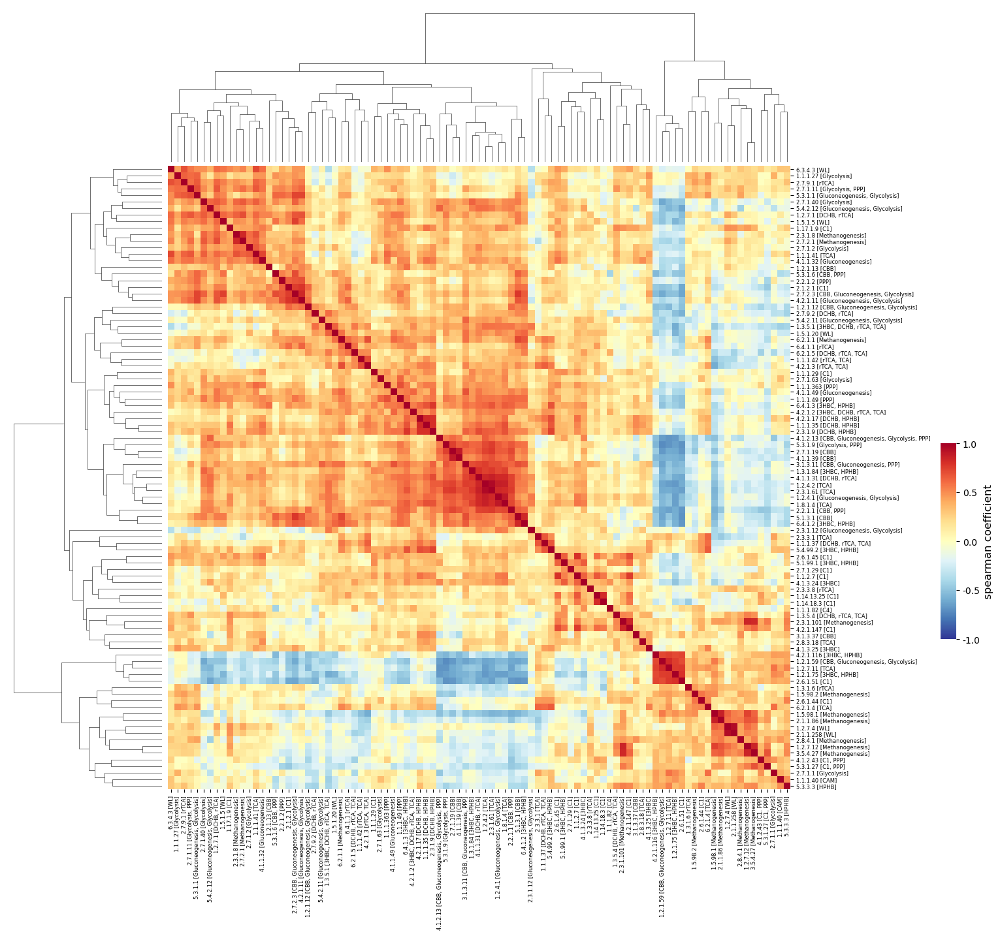

In [207]:
DATASET = dataset_carbon_n_readlength_rpo

# Calculate spearman correlation between rows
correlation_matrix = DATASET.T.corr(method='spearman')

# Function to get pathways for each EC number
def get_ec_pathways(ec_number, pathways_df):
    pathways = pathways_df[pathways_df['EC'] == ec_number]['pathway'].unique()
    return f"{ec_number} [{', '.join(pathways)}]"

# Create a list of labels with EC numbers and their associated pathways
labels_with_pathways = [get_ec_pathways(ec, pathways_df) for ec in DATASET.index]



# Create a clustermap using seaborn with bwr colormap
g = sns.clustermap(correlation_matrix, cmap='RdYlBu_r', 
                   xticklabels=labels_with_pathways, yticklabels=labels_with_pathways, 
                   method='average', metric='euclidean', cbar_pos=(0.73, 0.5, 0.012, 0.15),
                   vmin=-1, vmax=1)

# figure size
g.fig.set_size_inches(20, 20)

# label font size
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=6)
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=6)

# Set colorbar label
g.cax.set_ylabel('spearman coefficient', fontsize=12)

# Customize colorbar ticks and format
cbar = g.cax
cbar.set_yticks([-1, -0.5, 0, 0.5, 1]) 
cbar.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1f}')) 

# Remove axis titles
g.ax_heatmap.set_xlabel('')
g.ax_heatmap.set_ylabel('')

plt.show()


/var/folders/xd/tzd66fkj5s5676432q_qccqr0000gn/T/ipykernel_18308/538171627.py:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Pathway', y='Pearson Coefficient', data=df_plot, palette='Set3', boxprops={'alpha':0.6}, showfliers=False)


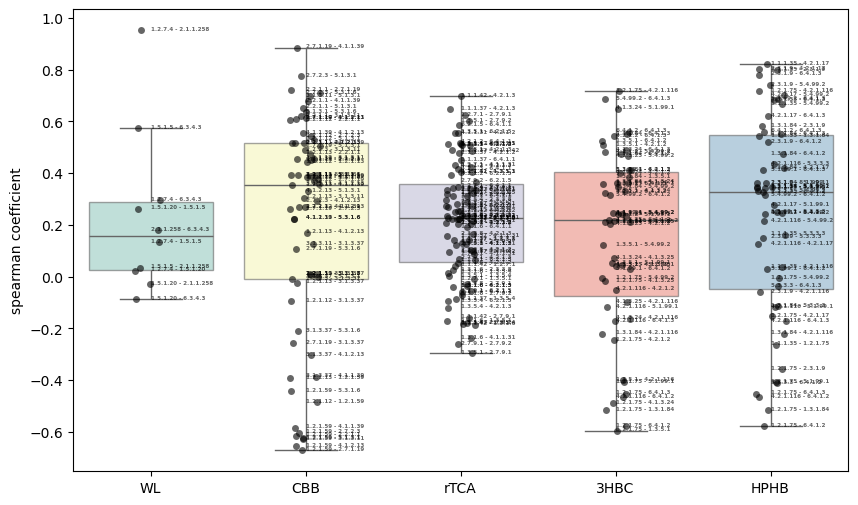

In [208]:
DATASET = dataset_carbon_n_readlength_rpo

# Calculate Spearman correlation on the original dataset
correlation_matrix = DATASET.T.corr(method='spearman')

# List of pathways to analyze
pathways_to_analyze = ['WL', 'CBB', 'rTCA', 'DHCB', '3HBC', 'HPHB']

# Initialize a list to store the correlation values for each pathway
data_for_plot = []

# Extract EC numbers and calculate Pearson values for each pathway
for pathway in pathways_to_analyze:
    # Get EC numbers associated with the current pathway
    ec_numbers = pathways_df[pathways_df['pathway'] == pathway]['EC'].unique()
    
    # Filter out EC numbers that are not in the dataset
    ec_numbers = [ec for ec in ec_numbers if ec in correlation_matrix.index]
    
    # Get the Pearson correlation values for EC numbers in this pathway
    for i, ec1 in enumerate(ec_numbers):
        for ec2 in ec_numbers[i+1:]:
            # Take the Pearson correlation between the two EC numbers
            correlation_value = correlation_matrix.loc[ec1, ec2]
            
            # Append the result with the pathway name and EC pair
            data_for_plot.append({'Pathway': pathway, 
                                  'Pearson Coefficient': correlation_value,
                                  'EC Pair': f"{ec1} - {ec2}"})

# Convert the data into a DataFrame
df_plot = pd.DataFrame(data_for_plot)

# Create the box plot with scatter dots overlapping the boxes
plt.figure(figsize=(10, 6))
sns.boxplot(x='Pathway', y='Pearson Coefficient', data=df_plot, palette='Set3', boxprops={'alpha':0.6}, showfliers=False)
sns.stripplot(x='Pathway', y='Pearson Coefficient', data=df_plot, color='black', jitter=True, alpha=0.6)

# Add labels to the dots
for i in range(len(df_plot)):
    plt.text(df_plot['Pathway'].iloc[i], df_plot['Pearson Coefficient'].iloc[i], 
             df_plot['EC Pair'].iloc[i], 
             horizontalalignment='left', 
             size=4, 
             color='black', 
             weight='semibold', 
             alpha=0.6)


plt.xlabel('')
plt.ylabel('spearman coefficient')

#plt.savefig('prevalence_per_pathway_spearman.pdf', dpi=300)
plt.show()


Definition of key ECs

In [ ]:
DATASET = dataset_carbon_n_readlength_rpo

## CBB
prk = "2.7.1.19"
rbc = "4.1.1.39"

gapn = "1.2.1.13" # according to KEGG is exclusive... and appear also high in plot #I checked and it seems indeed to be exclusive #and it is different to gapdh
sbpase = "3.1.3.37" #according to KEGG is exclusive... but appear low in the plot!!! #I checked and it seems indeed to be exclusive

## some also appears highly in correlation with these 2
#(pgk = "2.7.2.3" according to plot BUT also in other pathways... (only NGG?))
#(tkt = "2.2.1.1" according to plot BUT also in other pathways...)
#(fbp = "3.1.3.11" according to plot BUT also in other pathways...)
#(rpi = "5.3.1.6" according to plot BUT also in other pathways...)
#(fba = "4.1.2.13" according to plot BUT also in other pathways...)
#(gapdh = "1.2.1.12" according to plot BUT also in other pathways...)

#(rpe = "5.1.3.1" according to KEGG is exclusive... and appear also high in plot #I checked and IT IS WRONG: IT ALSO APPEARS IN PPP for KEGG so I think we did a mistake when filling the excel sheet)

CBB = DATASET.loc[DATASET.index.isin([prk, rbc])]
CBB_2 = DATASET.loc[DATASET.index.isin([prk, rbc, gapn])]
CBB_3 = DATASET.loc[DATASET.index.isin([prk, rbc, gapn, sbpase])]

col_sums_CBB = CBB.sum(axis=0)
col_sums_CBB_2 = CBB_2.sum(axis=0)
col_sums_CBB_3 = CBB_3.sum(axis=0)



## rTCA  

#TCA -> rTCA
# citrate synthase (2.3.3.1) -> citrate lyase (2.3.3.8) (specific of rTCA vs TCA BUT present in other ones [not so sure actually]) 
#                               (or also citryl-CoA lyase (4.1.3.34) + citryl-CoA synthetase (6.2.1.18))
# succinate dehydrogenase (1.3.99.1?? OBSOLETE! NOW 1.3.5.1) -> fumarate reductase (1.3.5.4 BUT also present in anaerobic resp) 
#                                                               (also 1.3.1.6 according to EC list? - and this one is exclusive!)
# α-ketoglutarate dehydrogenase (1.2.4.2) -> α-ketoglutarate synthase (1.2.7.3 - but present in BOTH TCA and rTCA?!)


acly = "2.3.3.8" # according to Fullerton
# ccl = "4.1.3.34" # according to above # FOUND IN FULLERTON BUT NOT IN DEBORAH'S
# ccs = "6.2.1.18" # according to above # FOUND IN FULLERTON BUT NOT IN DEBORAH'S

frd = "1.3.5.1" #according to Simkus (but also in the TCA cycle)
frd2 = "1.3.1.6" # according to above seems more exclusive than 1.3.5.1

# kor = "1.2.7.3" # according to above but present in BOTH TCA and rTCA?! # FOUND IN FULLERTON BUT NOT IN DEBORAH'S

#FROM THE PLOT
#(suc = "6.2.1.5" according to plot BUT also in many other pathways...)
#(idh = "1.1.1.42" according to plot BUT also in other pathways...)
#(aco = "4.2.1.3" according to plot BUT also in many other pathways...)
#(mdh = "1.1.1.37" according to plot BUT also in many other pathways...)
#(por = "1.2.7.1" according to plot BUT also in other pathways...) (and it is a bad one i think)
#(ppdk = "2.7.9.1" according to plot BUT also in other pathways...) (and it is a bad one i think)
#(pyc = "6.4.1.1" according to plot BUT also in other pathways...)
#(ppsA = "2.7.9.2" according to plot BUT also in other pathways...)


#4.2.1.2 is bad

rTCA = DATASET.loc[DATASET.index.isin([acly, frd2])]
rTCA_2 = DATASET.loc[DATASET.index.isin([acly, frd2, frd])]

col_sums_rTCA = rTCA.sum(axis=0)
col_sums_rTCA_2 = rTCA_2.sum(axis=0)




#WL
codh = "1.2.7.4"
fdh = "1.17.1.10" # FOUND IN FULLERTON BUT NOT IN DEBORAH'S
mcr = "2.8.4.1" #???? THAT's ACCORDING TO FULLERTON.. BUT ACCORDING TO KEGG it is associated with methanogenesis!!

MeTr = "2.1.1.258" # according to plot (and exclusive to WL)

mthfr = "1.5.1.20" # BAD according to plot (but seems exclusive to WL...)

fhs = "6.3.4.3" #according to Simkus
folD = "1.5.1.5" #according to Simkus
folD2 = "3.5.4.9" #according to Simkus


#NOTE ON 20250124: why not putting 2.3.1.169???? It s an essential one and used in Rodriguez 2025...


WL = DATASET.loc[DATASET.index.isin([codh, MeTr, fhs, folD])]
WL_2 = DATASET.loc[DATASET.index.isin([codh, MeTr, fhs, folD, mthfr])]
# SEE IF WE SHOULD TRY TO INCLUDE mcr

col_sums_WL = WL.sum(axis=0)
col_sums_WL_2 = WL_2.sum(axis=0)




#HB (also called 3HBC and 3HP?)
smt = "2.8.3.-" #according to Simkus # also according to KEGG (exclusive) #but not found in any mifaser
mct = "5.4.1.3" #according to Simkus # also according to KEGG (exclusive) # FOUND IN FULLERTON BUT NOT IN DEBORAH'S
meh = "4.2.1.153" #according to Simkus # also according to KEGG (exclusive) # FOUND IN FULLERTON BUT NOT IN DEBORAH'S
meh2 = "4.2.1.148" #according to Simkus # also according to KEGG (exclusive) # FOUND IN FULLERTON BUT NOT IN DEBORAH'S
smtab = "2.8.3.22" # according to KEGG (exclusive) (but i need to check) #but not found in any mifaser
mcl = "4.1.3.24" # according to KEGG (exclusive) (but i need to check) (##NOTE On 20240126: mcl and mcl2 are considered markers of HP+ethylmalonyl pathway+ formaldehyde assim)
mcl2 = "4.1.3.25" # according to KEGG (exclusive) (but i need to check) #but anticorrealtes almost with mcl!!!

#FROM THE PLOT
mcee = "5.1.99.1" #according to plot BUT also in HPHB...)
#(mcr2 = "1.2.1.75" according to plot BUT also in HPHB...)
#(hpcd = "4.2.1.116" according to plot BUT also in HPHB...)
#(mmut = "5.4.99.2" according to plot BUT also in HPHB...)
#(pcc = "6.4.1.3" according to plot BUT also in HPHB...)
#(acr = "1.3.1.84" according to plot BUT also in HPHB...)
#(acc = "6.4.1.2" according to plot BUT also in HPHB...)

#Note on 20240126:
"1.1.1.298" (used by Acinas 2021) should also be added to my list of C-associated genes!!! and classified as a HP marker!!

HB = DATASET.loc[DATASET.index.isin([mcl])]
HB_2 = DATASET.loc[DATASET.index.isin([mcl, mcl2])]
HB_3 = DATASET.loc[DATASET.index.isin([mcl, mcl2, mcee])]

col_sums_HB = HB.sum(axis=0)
col_sums_HB_2 = HB_2.sum(axis=0)
col_sums_HB_3 = HB_3.sum(axis=0)



#HPHB_DCHB (3HP/4HB)
fadN = "1.1.1.35" #according to Simkus (but also in DCHB!)
hbcl = "6.2.1.40" #according to Simkus (but also in DCHB!) # BUT NOT FOUND IN ANY DATASET
abfD = "5.3.3.3" # exclusive according to KEGG (but not sure its really an enzyme of the cycle)#Weird: I don't know how we got it from KEGG BEcause it seems just to be an ortholog)

ssr = "1.1.1.-" #another one that is also just in DCHB # BUT NOT FOUND IN ANY DATASET
sucD = "1.2.1.76" #another one that is also just in DCHB # BUT NOT FOUND IN ANY DATASET
acct = "2.3.1.9" #another one that is also just in DCHB
abfD2 = "4.2.1.120" #another one that is also just in DCHB # BUT NOT FOUND IN ANY DATASET #NOTE On 20240126: this gene is the HPHB_DCHB key gene used by Alfreider 2018 (they call it hcd)
ech = "4.2.1.17" #another one that is also just in DCHB


HPHB_DCHB = DATASET.loc[DATASET.index.isin([fadN, acct, ech])]
HPHB_DCHB_2 = DATASET.loc[DATASET.index.isin([fadN, acct, ech, abfD])]

col_sums_HPHB_DCHB = HPHB_DCHB.sum(axis=0)
col_sums_HPHB_DCHB_2 = HPHB_DCHB_2.sum(axis=0)


In [210]:
dataset_carbon_n_key_genes = DATASET.loc[DATASET.index.isin([prk, rbc, #CBB
                                                                               acly, frd2, #rTCA_
                                                                               codh, MeTr, fhs, folD, #WL
                                                                               mcl, #HB
                                                                               fadN, acct, ech #HPHB_DCHB
                                                                               ])]


'''dataset_carbon_n_key_genes = DATASET.loc[DATASET.index.isin([prk, rbc, gapn, sbpase, #CBB3
                                                                               acly, frd2, frd, #rTCA_2
                                                                               codh, MeTr, fhs, folD, mthfr, #WL_2
                                                                               mcl, mcl2, mcee, #HB_3
                                                                               fadN, acct, ech, abfD #HPHB_DCHB_2
                                                                               ])]
'''

'dataset_carbon_n_key_genes = DATASET.loc[DATASET.index.isin([prk, rbc, gapn, sbpase, #CBB3\n                                                                               acly, frd2, frd, #rTCA_2\n                                                                               codh, MeTr, fhs, folD, mthfr, #WL_2\n                                                                               mcl, mcl2, mcee, #HB_3\n                                                                               fadN, acct, ech, abfD #HPHB_DCHB_2\n                                                                               ])]\n'

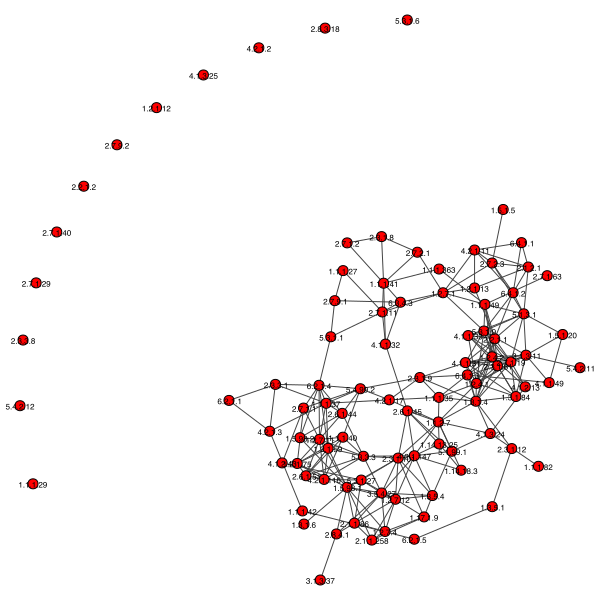

In [211]:

dataset_complete = dataset_carbon_n_readlength
#dataset_complete = dataset_carbon_n_key_genes #.dropna(axis=1, how='any') #because we have some missing data
#dataset_complete.index.name = None


correlation_matrix = dataset_complete.T.corr(method='spearman')
correlation_matrix[correlation_matrix < 0.5] = 0



# Create the graph from the matrix
bac_cor_ig = ig.Graph.Adjacency((correlation_matrix.values > 0).tolist(), mode="undirected")
bac_cor_ig.es['weight'] = correlation_matrix.values[correlation_matrix.values > 0]

# Simplify the graph to remove loops and multiple edges
bac_cor_ig = bac_cor_ig.simplify()

# Plot the graph
random.seed(200)
#layout = bac_cor_ig.layout_sugiyama()
#layout = 'auto'
layout = bac_cor_ig.layout_kamada_kawai() #g spring embedded
#layout = bac_cor_ig.layout_reingold_tilford()
ig.plot(bac_cor_ig, layout=layout, vertex_size=10, bbox=(600, 600), vertex_label=correlation_matrix.index, vertex_label_size=8, target="graph_plot.pdf")
#ig.plot(bac_cor_ig, vertex_size=10, bbox=(600, 600), vertex_label=correlation_matrix.index, vertex_label_size=8, target="graph_plot.pdf")



In [212]:
print(ec_c_fixation_df.pathway.unique())
ec_c_fixation_df['pathway'].replace({"3HBC": "HB", "DCHB": "HPHB_DCHB", "HPHB": "HPHB_DCHB"}, inplace=True)
print(ec_c_fixation_df.pathway.unique())


['3HBC' 'CBB' 'DCHB' 'HPHB' 'rTCA' 'WL']
['HB' 'CBB' 'HPHB_DCHB' 'rTCA' 'WL']


/var/folders/xd/tzd66fkj5s5676432q_qccqr0000gn/T/ipykernel_18308/1560838535.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  ec_c_fixation_df['pathway'].replace({"3HBC": "HB", "DCHB": "HPHB_DCHB", "HPHB": "HPHB_DCHB"}, inplace=True)
/var/folders/xd/tzd66fkj5s5676432q_qccqr0000gn/T/ipykernel_18308/1560838535.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

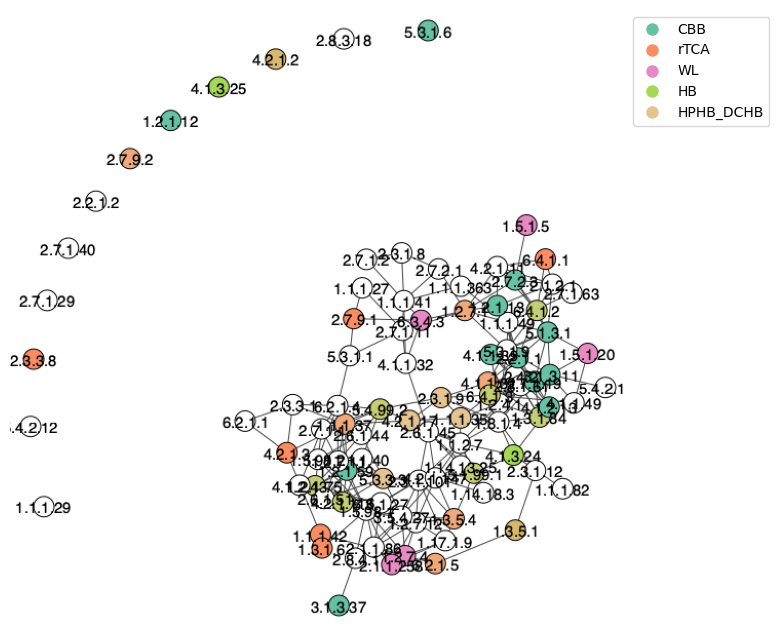

In [213]:

# Create a dictionary mapping EC numbers to pathways
ec_to_pathways = ec_c_fixation_df.groupby('EC')['pathway'].apply(list).to_dict()

# Define the list of possible pathways
#possible_pathways = ['3HBC', 'C1', 'C4', 'CAM', 'CBB', 'DCHB', 'Gluconeogenesis',
 #                    'Glycolysis', 'HPHB', 'InrTCA', 'Methanogenesis', 'PPP', 'rTCA',
 #                    'TCA', 'WL']
possible_pathways = ['CBB', 'rTCA', 'WL', 'HB', 'HPHB_DCHB']

# Use a specific colormap for distinct colors
cmap = plt.get_cmap('Set2')
color_map = {pathway: cmap(i / len(possible_pathways)) for i, pathway in enumerate(possible_pathways)}


# Function to mix colors if an EC number is associated with multiple pathways
def mix_colors(colors):
    return tuple(sum(x) / len(x) for x in zip(*colors))

# Assign colors to vertices based on their associated pathways
vertex_colors = []
for ec in correlation_matrix.index:
    if ec in ec_to_pathways:
        pathways = ec_to_pathways[ec]
        if len(pathways) > 1:
            mixed_color = mix_colors([color_map[path] for path in pathways])
            vertex_colors.append(mcolors.to_hex(mixed_color))
        else:
            vertex_colors.append(mcolors.to_hex(color_map[pathways[0]]))
    else:
        vertex_colors.append("white")  # Default to black if no pathway is found

# Set the vertex colors
bac_cor_ig.vs['color'] = vertex_colors

random.seed(2)
# Plot using the explicit layout
ig.plot(
    bac_cor_ig, 
    layout=layout, 
    vertex_size=20, 
    bbox=(600, 600), 
    vertex_label=correlation_matrix.index, 
    vertex_label_size=15, 
    target="/tmp/graph_plot.png"  # Save plot to this path
)

# Load the graph plot image
graph_img = Image.open("/tmp/graph_plot.png")

# Plot the graph image and the legend together
fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(graph_img)
ax.axis('off')  # Turn off the axis

# Create a legend using matplotlib
legend_elements = [Line2D([0], [0], marker='o', color='w', label=pathway, 
                          markerfacecolor=mcolors.to_hex(color_map[pathway]), markersize=10)
                   for pathway in possible_pathways]

# Add the legend
ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1, 1))

plt.savefig("graph_with_legend.pdf", format="pdf")

plt.show()


## Testing representative genes against the environmental parameters

prk = "2.7.1.19"
rbc = "4.1.1.39"
acly = "2.3.3.8"
codh = "1.2.7.4"
fdh = "1.17.1.10"
mcr = "2.8.4.1"

In [254]:

# copy envadata to make furhter chnages on it
envdata_copy = envdata.copy()


In [255]:
# Check if all column names of ecdata_n are in the index of envdata_copy
missing_in_envdata_copy = [col for col in ecdata_n.columns if col not in envdata_copy.index]
if missing_in_envdata_copy:
    print("Columns in ecdata_n not in envdata_copy index:", missing_in_envdata_copy)
else:
    print("All columns of ecdata_n are present in envdata_copy index.")

# Check which indexes from envdata_copy are not in the column names of ecdata_n
missing_in_ecdata_n = [idx for idx in envdata_copy.index if idx not in ecdata_n.columns]
if missing_in_ecdata_n:
    print("Indexes in envdata_copy not in ecdata_n columns:", missing_in_ecdata_n)
else:
    print("All indexes of envdata_copy are present in ecdata_n columns.")


All columns of ecdata_n are present in envdata_copy index.
Indexes in envdata_copy not in ecdata_n columns: ['SAMD00080625', 'SAMN05449942', 'SAMN05449943', 'SAMN05449944', 'SAMN05518182', 'SAMN06267146', 'SAMN06562582', 'SAMN06706385', 'SAMN06706403', 'SAMN10130915']


I want to create 2 datasets: gendata and envdata_copy, that will allow to evaluate the co-occurence of CFPs with 1. other ECs 2. env parameters

In [256]:
#DEFINE WHICH OPERATION YOU WANT TO PERFORM ON THE CLIQUES
operation = 'sum'

#DEFINE WHICH DATASET (AND THERBY WHICH NORMALIZATION) YOU  WANT TO WORK WITH
dataset = ecdata_n_readlength
gendata = dataset.transpose()

# perform the operation of each clique in a new col 
gendata[f'{operation}_CBB'] = getattr(gendata[CBB.index.tolist()], operation)(axis=1)
gendata[f'{operation}_CBB_2'] = getattr(gendata[CBB_2.index.tolist()], operation)(axis=1)
gendata[f'{operation}_CBB_3'] = getattr(gendata[CBB_3.index.tolist()], operation)(axis=1)
gendata[f'{operation}_rTCA'] = getattr(gendata[rTCA.index.tolist()], operation)(axis=1)
gendata[f'{operation}_rTCA_2'] = getattr(gendata[rTCA_2.index.tolist()], operation)(axis=1)
gendata[f'{operation}_WL'] = getattr(gendata[WL.index.tolist()], operation)(axis=1)
gendata[f'{operation}_WL_2'] = getattr(gendata[WL_2.index.tolist()], operation)(axis=1)
gendata[f'{operation}_HB'] = getattr(gendata[HB.index.tolist()], operation)(axis=1)
gendata[f'{operation}_HB_2'] = getattr(gendata[HB_2.index.tolist()], operation)(axis=1)
gendata[f'{operation}_HB_3'] = getattr(gendata[HB_3.index.tolist()], operation)(axis=1)
gendata[f'{operation}_HPHB_DCHB'] = getattr(gendata[HPHB_DCHB.index.tolist()], operation)(axis=1)
gendata[f'{operation}_HPHB_DCHB_2'] = getattr(gendata[HPHB_DCHB_2.index.tolist()], operation)(axis=1)
gendata[f'{operation}_CFP'] = getattr(gendata[CBB.index.tolist() + rTCA.index.tolist() + WL.index.tolist() + HB.index.tolist() + HPHB_DCHB.index.tolist()], operation)(axis=1)
gendata[f'{operation}_CFP_2'] = getattr(gendata[CBB_2.index.tolist() + rTCA_2.index.tolist() + WL_2.index.tolist() + HB_2.index.tolist() + HPHB_DCHB_2.index.tolist()], operation)(axis=1)
gendata[f'{operation}_CFP_3'] = getattr(gendata[CBB_3.index.tolist() + rTCA_2.index.tolist() + WL_2.index.tolist() + HB_3.index.tolist() + HPHB_DCHB_2.index.tolist()], operation)(axis=1)

gendata[f'{operation}_rbc'] = gendata[rbc] ## TEST TO HAVE ONLY ONE GENE



# Merge with envdata_copy on their common index
envdata_copy = envdata_copy.merge(gendata, left_index=True, right_index=True)

#Once you have calcutated these indicators, remove again all the EC numbers from envdata_copy
envdata_copy = envdata_copy.drop(columns=dataset.transpose().columns)

In [257]:
# For gendata I want to exclude all C-related genes (to see if totally different genes can correlate with CFPs) 
# (but i could try to include at least ones that are C-related but not CFPs...)
gendata = gendata.drop(columns=ec_list, errors='ignore')


test: plot clique X against a parameter

/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Figure size 350x300 with 0 Axes>

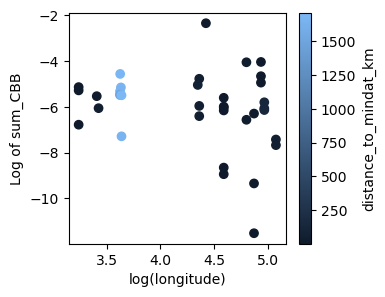

Spearman correlation coefficient (rho): nan
P-value: nan


In [267]:
plt.figure(figsize=(3.5, 3))  

clique = f"{operation}_CBB"
param = "longitude"

cmap = mcolors.LinearSegmentedColormap.from_list(
    'custom_blues',
    ['#0f1b2cff', '#7cb8f6ff']
)

# Remove rows with NaN values in the columns used
clean_data = envdata_copy[[f'{param}', f'{clique}']].dropna()

# Scatter plot with color based on 'distance_to_mindat_km'
plt.figure(figsize=(3.5, 3))
scatter = plt.scatter(np.log(clean_data[f'{param}']), np.log(clean_data[f'{clique}']), 
                      c=envdata_copy.loc[clean_data.index, 'distance_to_mindat_km'], cmap=cmap)

# Add colorbar
plt.colorbar(scatter, label='distance_to_mindat_km')

plt.xlabel(f'log({param})')
plt.ylabel(f'Log of {clique}')
plt.show()

# Calculate Spearman correlation
rho, p_value = spearmanr(np.log(clean_data[f'{param}']), np.log(clean_data[f'{clique}']))

print(f"Spearman correlation coefficient (rho): {rho}")
print(f"P-value: {p_value}")


### Test each clique against each other (first with log transformation... so need to remove zeros first to avoid inf values in the log transformation)

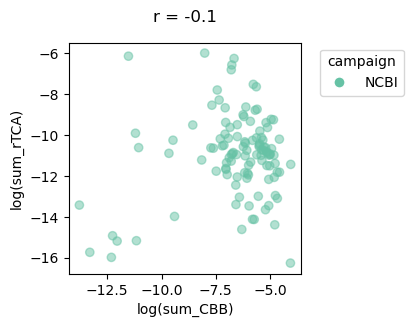

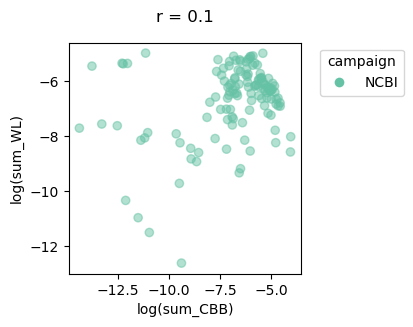

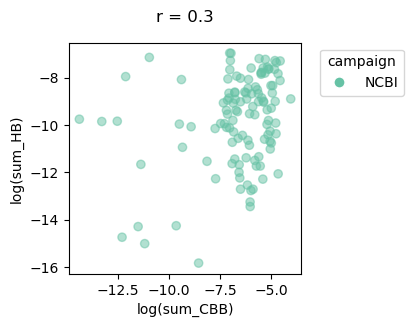

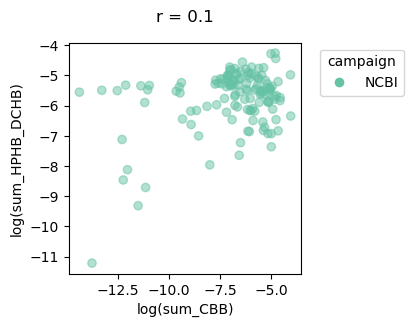

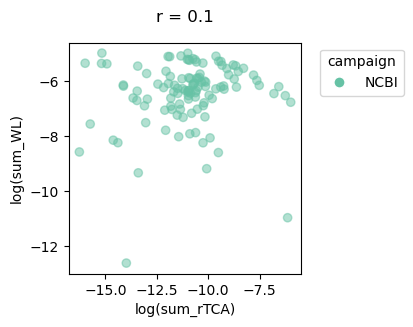

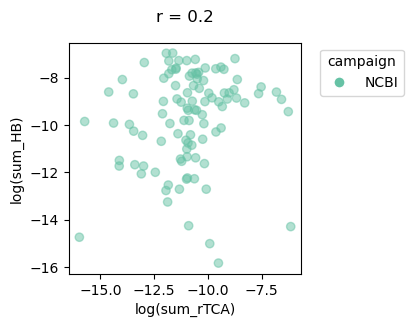

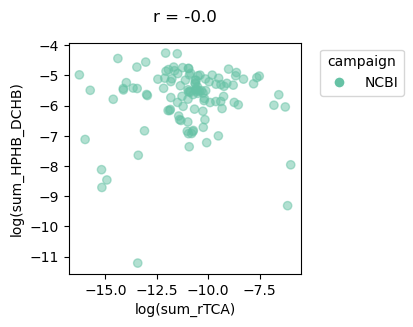

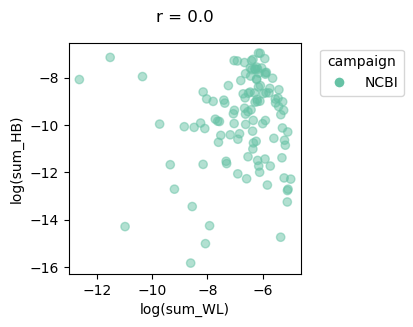

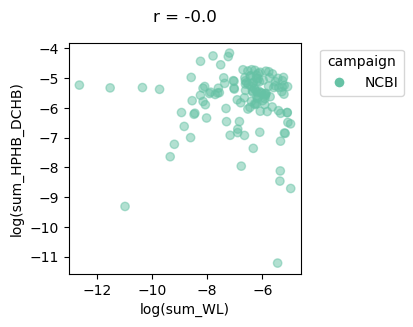

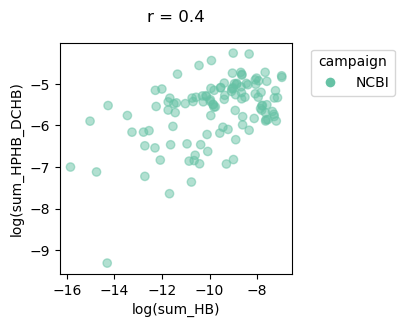

In [259]:
# List of parameters to plot against each other
parameters = [f'{operation}_CBB', f'{operation}_rTCA', f'{operation}_WL', f'{operation}_HB', f'{operation}_HPHB_DCHB']

VARIABLE = "campaign"

# Get unique campaign values and create a color map
VARIABLE_values = envdata_copy[VARIABLE].unique()
VARIABLE_colors = {val: color for val, color in zip(VARIABLE_values, cm.Set2(np.linspace(0, 1, len(VARIABLE_values))))}

# Loop over each pair of parameters
for x_param, y_param in itertools.combinations(parameters, 2):
    x = np.log(envdata_copy[x_param].replace(0, np.nan)).dropna()
    y = np.log(envdata_copy[y_param].replace(0, np.nan)).dropna()
    
    # Keep only overlapping data points
    x, y = x.align(y, join='inner')
    
    # Get the corresponding colors for each data point based on VARIABLE values
    colors = envdata_copy.loc[x.index, VARIABLE].map(VARIABLE_colors)

    # Scatter plot
    plt.figure(figsize=(3, 3))
    scatter = plt.scatter(x, y, c=colors, alpha=0.5)
    plt.xlabel(f'log({x_param})')
    plt.ylabel(f'log({y_param})')
    
    # Calculate Spearman correlation
    r, _ = spearmanr(x, y)
    
    # Display r above the plot
    plt.title(f'r = {r:.1f}', pad=15)
    
    # Show color legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8)
               for color in VARIABLE_colors.values()]
    plt.legend(handles, VARIABLE_colors.keys(), title=VARIABLE, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()


### Test each clique against each other (now without log transformation... so I dont need to remove zeros first to avoid inf values in the log transformation)

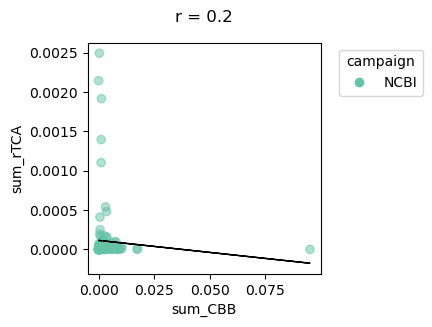

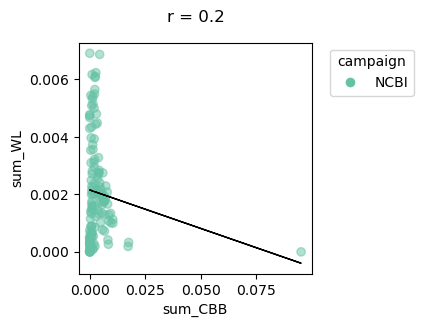

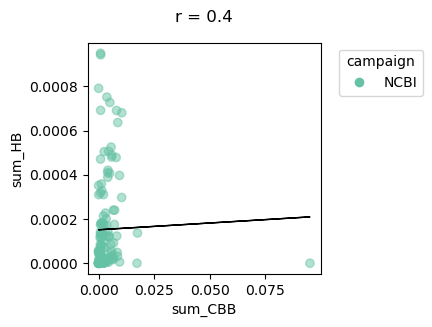

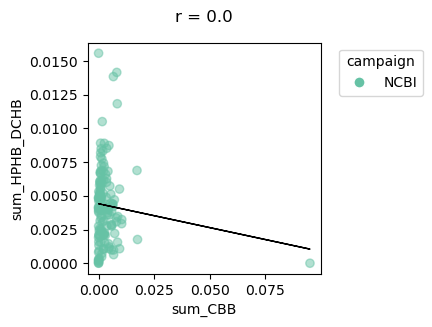

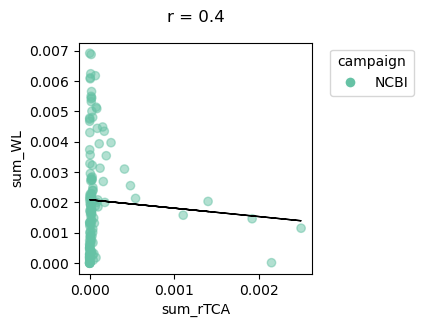

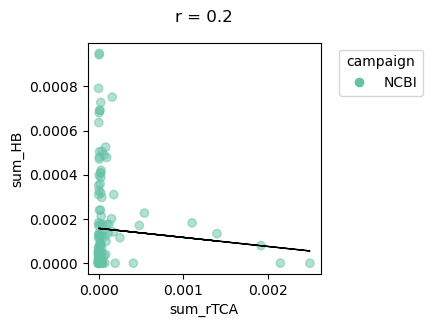

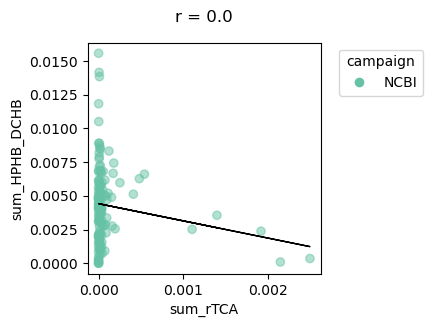

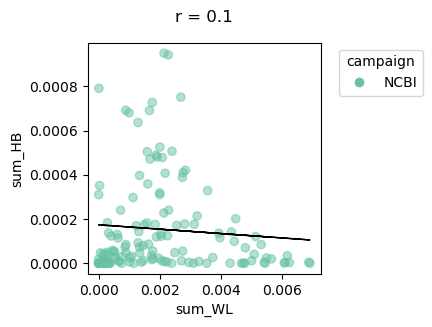

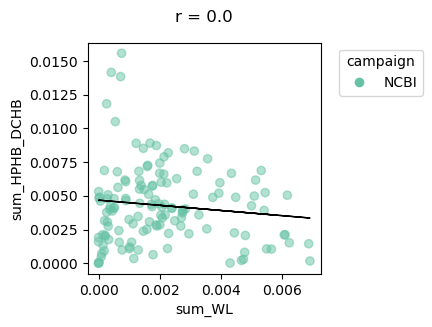

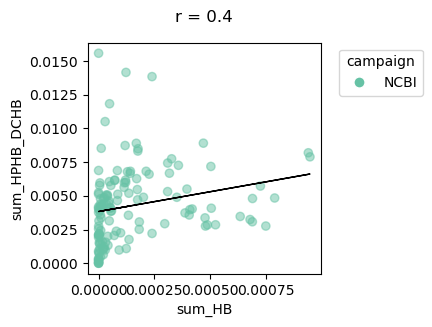

In [260]:
# List of parameters to plot against each other
parameters = [f'{operation}_CBB', f'{operation}_rTCA', f'{operation}_WL', f'{operation}_HB', f'{operation}_HPHB_DCHB']


# Loop over each pair of parameters
for x_param, y_param in itertools.combinations(parameters, 2):

    x = envdata_copy[x_param]
    y = envdata_copy[y_param]
    
    # Get the corresponding colors for each data point based on VARIABLE values
    colors = envdata_copy.loc[x.index, VARIABLE].map(VARIABLE_colors)

    # Scatter plot
    plt.figure(figsize=(3, 3))
    scatter = plt.scatter(x, y, c=colors, alpha=0.5)
    plt.xlabel(f'{x_param}')
    plt.ylabel(f'{y_param}')
    
    # Calculate Spearman correlation
    r, _ = spearmanr(x, y)
    
    # Display r above the plot
    plt.title(f'r = {r:.1f}', pad=15)
    
    # Plot regression line
    slope, intercept, _, _, _ = linregress(x, y)
    plt.plot(x, slope * x + intercept, color='black', linewidth=1)
    

    # Show color legend
    handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=8)
               for color in VARIABLE_colors.values()]
    plt.legend(handles, VARIABLE_colors.keys(), title=VARIABLE, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.show()


### Remove, from these 2 datasets, columns with all NaN or only one unique value

In [261]:

# Columns with all NaN or only one unique value
columns_to_remove_env = envdata_copy.columns[envdata_copy.isna().all() | (envdata_copy.nunique() <= 1)]
columns_to_remove_gen = gendata.columns[gendata.isna().all() | (gendata.nunique() <= 1)]

# Print the column names that will be removed
print("Removed columns in envdata_copy:", columns_to_remove_env.tolist())
print("Removed columns in gendata:", columns_to_remove_gen.tolist())

# Now remove the columns
envdata_copy = envdata_copy.drop(columns=columns_to_remove_env)
gendata = gendata.drop(columns=columns_to_remove_gen)


Removed columns in envdata_copy: ['campaign', 'site_id', 'database', 'Li_aq', 'Be_aq', 'B_aq', 'Al_aq', 'P_aq', 'Ti_aq', 'V_aq', 'Cr_aq', 'Mn_aq', 'Fe_aq', 'Co_aq', 'Ni_aq', 'Cu_aq', 'Zn_aq', 'Ga_aq', 'As_aq', 'Se_aq', 'Rb_aq', 'Sr_aq', 'Zr_aq', 'Nb_aq', 'Mo_aq', 'Pd_aq', 'Ag_aq', 'Cd_aq', 'Sn_aq', 'Sb_aq', 'Cs_aq', 'Ba_aq', 'La_aq', 'Ce_aq', 'Pr_aq', 'Nd_aq', 'W_aq', 'Tl_aq', 'Pb_aq', 'Yh_aq', 'U_aq', 'gd', 'sc', 'ConShelf', 'Time_rift', 'Water_type', 'iron_proteins']
Removed columns in gendata: ['1.11.1.13', '1.11.1.14', '1.11.1.23', '1.11.2.2', '1.13.11.45', '1.13.11.48', '1.13.12.13', '1.13.12.22', '1.13.12.9', '1.14.11.28', '1.14.11.35', '1.14.11.56', '1.14.14.14', '1.14.14.23', '1.14.20.4', '1.14.99.48', '1.17.1.3', '1.21.99.3', '1.3.1.122', '1.3.7.12', '1.3.7.4', '1.3.99.36', '1.7.6.1', '2.1.1.145', '2.1.1.150', '2.1.1.204', '2.1.1.233', '2.1.1.28', '2.1.1.284', '2.1.1.49', '2.3.1.140', '2.3.1.151', '2.3.1.160', '2.3.1.202', '2.3.1.43', '2.3.1.59', '2.3.2.10', '2.3.2.20', '2.4.1

Test a clique vs env parameters

/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/benoitdepins/miniconda3/envs/subcarb/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufun

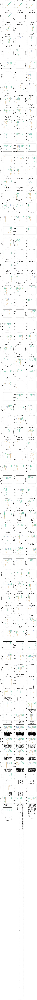

In [262]:


clique = f"{operation}_CBB"
VARIABLE = "tectonics2"

# Get unique campaign values and create a color map
VARIABLE_values = envdata_copy[VARIABLE].unique()
VARIABLE_colors = {val: color for val, color in zip(VARIABLE_values, cm.Set2(np.linspace(0, 1, len(VARIABLE_values))))}

# Store the correlation values and column names separately for numeric and categorical data
numeric_correlations = []
categorical_correlations = []

# Calculate correlations for each column
for column in envdata_copy.columns:
    if pd.api.types.is_numeric_dtype(envdata_copy[column]):
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        valid_data = valid_data[(valid_data[column] > 0) & (valid_data[f'{clique}'] > 0)]
        
        if not valid_data.empty:
            x = np.log(valid_data[column])
            y = np.log(valid_data[f'{clique}'])
            
            if x.std() != 0 and y.std() != 0:
                corr, _ = spearmanr(x, y)
            else:
                corr = float('nan')
        else:
            corr = float('nan')
        
        if not np.isnan(corr):
            numeric_correlations.append((column, corr))
    
    else:
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        
        if not valid_data.empty:
            x = valid_data[column]
            y = np.log(valid_data[f'{clique}'])
            
            unique_categories = x.dropna().unique()
            category_map = {category: idx for idx, category in enumerate(unique_categories)}
            numeric_categories = x.map(category_map)
            
            corr, _ = spearmanr(numeric_categories, y)
        else:
            corr = float('nan')
        
        if not np.isnan(corr):
            categorical_correlations.append((column, corr))

# Sort both numeric and categorical columns by absolute value of correlations
sorted_numeric = sorted(numeric_correlations, key=lambda x: abs(x[1]), reverse=True)
sorted_categorical = sorted(categorical_correlations, key=lambda x: abs(x[1]), reverse=True)
sorted_columns = sorted_numeric + sorted_categorical

# Plotting
n_rows = int(np.ceil(len(sorted_columns) / 3))
fig, axes = plt.subplots(n_rows, 3, figsize=(10, 3.5 * n_rows))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.4)
axes = axes.flatten()

# Plot each column based on the sorted order with regression
for i, (column, corr) in enumerate(sorted_columns):
    ax = axes[i]
    
    if pd.api.types.is_numeric_dtype(envdata_copy[column]):
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        valid_data = valid_data[(valid_data[column] > 0) & (valid_data[f'{clique}'] > 0)]
        
        if not valid_data.empty:
            x = np.log(valid_data[column])
            y = np.log(valid_data[f'{clique}'])
            colors = valid_data[VARIABLE].map(VARIABLE_colors)
            
            ax.scatter(x, y, alpha=0.5, c=colors)
            ax.set_xlabel(f'log({column})')
            ax.set_ylabel(f'log({clique})')
            ax.set_title(f'Spearman: {corr:.2f}')
            
        else:
            ax.set_title('No valid data')
    
    else:
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        
        if not valid_data.empty:
            x = valid_data[column]
            y = np.log(valid_data[f'{clique}'])
            
            unique_categories = x.dropna().unique()
            category_map = {category: idx for idx, category in enumerate(unique_categories)}
            numeric_categories = x.map(category_map)
            colors = valid_data[VARIABLE].map(VARIABLE_colors)
            
            ax.scatter(numeric_categories, y, alpha=0.5, c=colors)
            ax.set_xlabel(column)
            ax.set_ylabel(f'log({clique})')
            ax.set_xticks(range(len(unique_categories)))
            ax.set_xticklabels(unique_categories, rotation=90)
            ax.set_title(f'Spearman: {corr:.2f}')
            
        else:
            ax.set_title('No valid data')

# Turn off unused subplots
for j in range(len(sorted_columns), len(axes)):
    axes[j].axis('off')


plt.tight_layout()
plt.show()


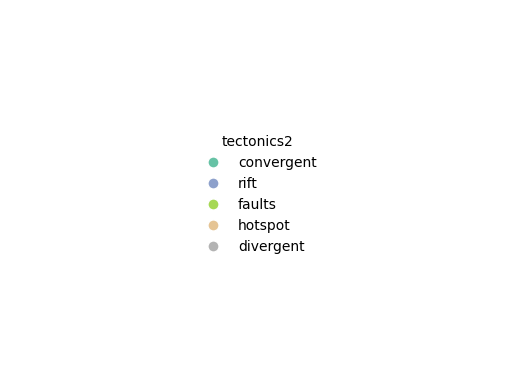

In [223]:
# Code to display only the legend box for the campaign colors
import matplotlib.pyplot as plt

legend_fig = plt.figure()
legend_ax = legend_fig.add_subplot(111)
legend_ax.axis('off')

legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=val, markerfacecolor=color, markersize=8)
                   for val, color in VARIABLE_colors.items()]

legend_ax.legend(handles=legend_elements, loc='center', title=VARIABLE, frameon=False)
plt.show()


In [224]:
clique = f"{operation}_CBB"
VARIABLE = "campaign"

# Get unique campaign values and create a color map
VARIABLE_values = envdata_copy[VARIABLE].unique()
VARIABLE_colors = {val: color for val, color in zip(VARIABLE_values, cm.Set2(np.linspace(0, 1, len(VARIABLE_values))))}

# Store the correlation values and column names separately for numeric and categorical data
numeric_correlations = []
categorical_correlations = []

# Calculate correlations for each column
for column in envdata_copy.columns:
    if pd.api.types.is_numeric_dtype(envdata_copy[column]):
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        
        if not valid_data.empty:
            x = valid_data[column]
            y = valid_data[f'{clique}']
            
            if x.std() != 0 and y.std() != 0:
                corr, _ = spearmanr(x, y)
            else:
                corr = float('nan')
        else:
            corr = float('nan')
        
        if not np.isnan(corr):
            numeric_correlations.append((column, corr))
    
    else:
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        
        if not valid_data.empty:
            x = valid_data[column]
            y = valid_data[f'{clique}']
            
            unique_categories = x.dropna().unique()
            category_map = {category: idx for idx, category in enumerate(unique_categories)}
            numeric_categories = x.map(category_map)
            
            corr, _ = spearmanr(numeric_categories, y)
        else:
            corr = float('nan')
        
        if not np.isnan(corr):
            categorical_correlations.append((column, corr))

# Sort both numeric and categorical columns by absolute value of correlations
sorted_numeric = sorted(numeric_correlations, key=lambda x: abs(x[1]), reverse=True)
sorted_categorical = sorted(categorical_correlations, key=lambda x: abs(x[1]), reverse=True)
sorted_columns = sorted_numeric + sorted_categorical

# Plotting
n_rows = int(np.ceil(len(sorted_columns) / 3))
fig, axes = plt.subplots(n_rows, 3, figsize=(10, 3.5 * n_rows))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.4)
axes = axes.flatten()

# Plot each column based on the sorted order with regression
for i, (column, corr) in enumerate(sorted_columns):
    ax = axes[i]
    
    if pd.api.types.is_numeric_dtype(envdata_copy[column]):
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        
        if not valid_data.empty:
            x = valid_data[column]
            y = valid_data[f'{clique}']
            colors = valid_data[VARIABLE].map(VARIABLE_colors)
            
            ax.scatter(x, y, alpha=0.5, c=colors)
            ax.set_xlabel(column)
            ax.set_ylabel(clique)
            ax.set_title(f'Spearman: {corr:.2f}')

            # Calculate and plot regression line
            slope, intercept, _, _, _ = linregress(x, y)
            ax.plot(x, slope * x + intercept, color='black', linewidth=1)

        else:
            ax.set_title('No valid data')
    
    else:
        valid_data = envdata_copy.dropna(subset=[column, f'{clique}', VARIABLE])
        
        if not valid_data.empty:
            x = valid_data[column]
            y = valid_data[f'{clique}']
            
            unique_categories = x.dropna().unique()
            category_map = {category: idx for idx, category in enumerate(unique_categories)}
            numeric_categories = x.map(category_map)
            colors = valid_data[VARIABLE].map(VARIABLE_colors)
            
            ax.scatter(numeric_categories, y, alpha=0.5, c=colors)
            ax.set_xlabel(column)
            ax.set_ylabel(clique)
            ax.set_xticks(range(len(unique_categories)))
            ax.set_xticklabels(unique_categories, rotation=90)
            ax.set_title(f'Spearman: {corr:.2f}')
            
        else:
            ax.set_title('No valid data')

# Turn off unused subplots
for j in range(len(sorted_columns), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

KeyError: 'campaign'

Test a clique vs gen parameters (only first XX plots)

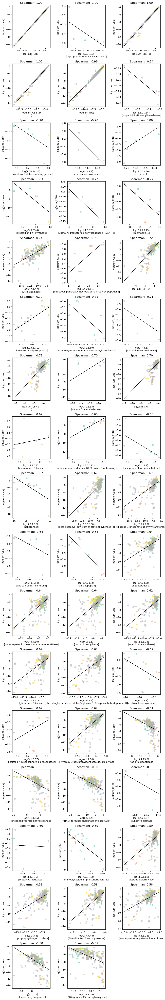

In [ ]:
clique = f"{operation}_CBB"
Num_plots = 50  # number of plots to show

# Load enzyme names
ec_df = pd.read_csv("full_ec_list.csv")
ec_dict = ec_df.set_index('ec')['name'].to_dict()

# Define colors for VARIABLE values in envdata_copy matching gendata indices
VARIABLE_values = envdata_copy.loc[gendata.index, VARIABLE].unique()
VARIABLE_colors = {val: color for val, color in zip(VARIABLE_values, cm.Set2(np.linspace(0, 1, len(VARIABLE_values))))}

# Store the correlation values and column names
correlations = []

# Calculate Spearman correlations for each column
for column in gendata.columns:
    valid_data = gendata.dropna(subset=[column, f'{clique}'])
    valid_data = valid_data[(valid_data[column] > 0) & (valid_data[f'{clique}'] > 0)]
    
    if len(valid_data) >= 5:  # Ensure at least 5 valid points
        x = np.log(valid_data[column])
        y = np.log(valid_data[f'{clique}'])
        
        corr, _ = spearmanr(x, y)
    else:
        corr = float('nan')
    
    if not np.isnan(corr):
        correlations.append((column, corr))

# Sort columns by the absolute value of correlations
sorted_columns = sorted(correlations, key=lambda x: abs(x[1]), reverse=True)[:Num_plots]

# Set up subplots
n_rows = int(np.ceil(len(sorted_columns) / 3))
fig, axes = plt.subplots(n_rows, 3, figsize=(10, 3.5 * n_rows))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.4)
axes = axes.flatten()

# Plot each column based on the sorted order
for i, (column, corr) in enumerate(sorted_columns):
    ax = axes[i]
    enzyme_name = ec_dict.get(column, "")
    
    valid_data = gendata.dropna(subset=[column, f'{clique}'])
    valid_data = valid_data[(valid_data[column] > 0) & (valid_data[f'{clique}'] > 0)]
    
    if len(valid_data) >= 5:  # Ensure at least 5 valid points for plotting
        x = np.log(valid_data[column])
        y = np.log(valid_data[f'{clique}'])
        
        # Map colors based on VARIABLE values in envdata_copy
        colors = envdata_copy.loc[valid_data.index, VARIABLE].map(VARIABLE_colors)
        
        ax.scatter(x, y, alpha=0.5, c=colors)
        ax.set_xlabel(f'log({column})\n[{enzyme_name}]')
        ax.set_ylabel(f'log({clique})')
        ax.set_title(f'Spearman: {corr:.2f}')
        
        # Calculate and plot regression line
        slope, intercept, _, _, _ = linregress(x, y)
        ax.plot(x, slope * x + intercept, color='black', linewidth=1)
    else:
        ax.set_title('No valid data')

# Turn off unused subplots
for j in range(len(sorted_columns), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


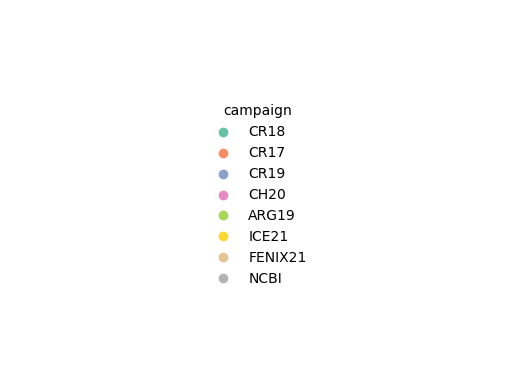

In [ ]:
# Plot legend for VARIABLE colors
fig, ax = plt.subplots()
for val, color in VARIABLE_colors.items():
    ax.scatter([], [], color=color, label=val)
ax.legend(title=VARIABLE, loc='center', frameon=False)
ax.axis('off')
plt.show()


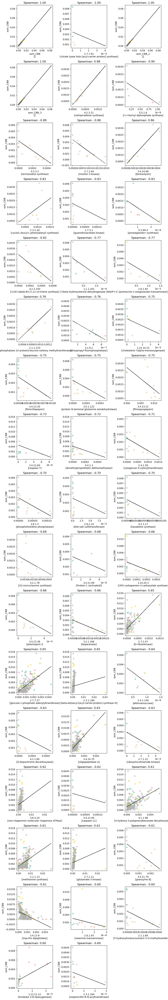

In [ ]:
clique = f"{operation}_CBB"
Num_plots = 50  # number of plots to show

# Load enzyme names
ec_df = pd.read_csv("full_ec_list.csv")
ec_dict = ec_df.set_index('ec')['name'].to_dict()

# Define colors for VARIABLE values in envdata_copy matching gendata indices
VARIABLE_values = envdata_copy.loc[gendata.index, VARIABLE].unique()
VARIABLE_colors = {val: color for val, color in zip(VARIABLE_values, cm.Set2(np.linspace(0, 1, len(VARIABLE_values))))}

# Store the correlation values and column names
correlations = []

# Calculate Spearman correlations for each column
for column in gendata.columns:
    valid_data = gendata.dropna(subset=[column, f'{clique}'])
   # valid_data = valid_data[(valid_data[column] > 0) & (valid_data[f'{clique}'] > 0)]
    
    if len(valid_data) >= 5:  # Ensure at least 5 valid points
        x = valid_data[column]
        y = valid_data[f'{clique}']
        
        corr, _ = spearmanr(x, y)
    else:
        corr = float('nan')
    
    if not np.isnan(corr):
        correlations.append((column, corr))

# Sort columns by the absolute value of correlations
sorted_columns = sorted(correlations, key=lambda x: abs(x[1]), reverse=True)[:Num_plots]

# Set up subplots
n_rows = int(np.ceil(len(sorted_columns) / 3))
fig, axes = plt.subplots(n_rows, 3, figsize=(10, 3.5 * n_rows))
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.5, wspace=0.4)
axes = axes.flatten()

# Plot each column based on the sorted order
for i, (column, corr) in enumerate(sorted_columns):
    ax = axes[i]
    enzyme_name = ec_dict.get(column, "")
    
    valid_data = gendata.dropna(subset=[column, f'{clique}'])
    #valid_data = valid_data[(valid_data[column] > 0) & (valid_data[f'{clique}'] > 0)]
    
    if len(valid_data) >= 5:  # Ensure at least 5 valid points for plotting
        x = valid_data[column]
        y = valid_data[f'{clique}']
        
        # Map colors based on VARIABLE values in envdata_copy
        colors = envdata_copy.loc[valid_data.index, VARIABLE].map(VARIABLE_colors)
        
        ax.scatter(x, y, alpha=0.5, c=colors)
        ax.set_xlabel(f'{column}\n[{enzyme_name}]')
        ax.set_ylabel(f'{clique}')
        ax.set_title(f'Spearman: {corr:.2f}')
        
        # Calculate and plot regression line
        slope, intercept, _, _, _ = linregress(x, y)
        ax.plot(x, slope * x + intercept, color='black', linewidth=1)
    else:
        ax.set_title('No valid data')

# Turn off unused subplots
for j in range(len(sorted_columns), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


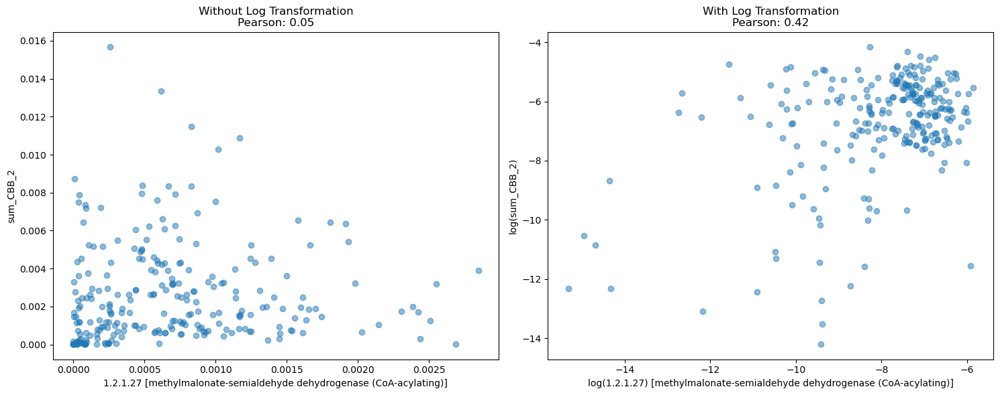

In [161]:
#TEST WITH ONE GENE
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

clique = f"{operation}_CBB_2"
column_to_plot = '1.2.1.27'

# Load enzyme names
ec_df = pd.read_csv("full_ec_list.csv")
ec_dict = ec_df.set_index('ec')['name'].to_dict()

# Prepare valid data
valid_data = gendata.dropna(subset=[column_to_plot, clique])
valid_data = valid_data[(valid_data[column_to_plot] > 0) & (valid_data[clique] > 0)]

# Ensure there are enough valid points
if len(valid_data) >= 5:
    # Without log transformation
    x_no_log = valid_data[column_to_plot]
    y_no_log = valid_data[clique]
    corr_no_log, _ = pearsonr(x_no_log, y_no_log)

    # With log transformation
    x_log = np.log(valid_data[column_to_plot])
    y_log = np.log(valid_data[clique])
    corr_log, _ = pearsonr(x_log, y_log)

    # Set up subplots
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Plot without log transformation
    ax1 = axes[0]
    ax1.scatter(x_no_log, y_no_log, alpha=0.5)
    ax1.set_xlabel(f'{column_to_plot} [{ec_dict.get(column_to_plot, "")}]')
    ax1.set_ylabel(f'{clique}')
    ax1.set_title(f'Without Log Transformation\nPearson: {corr_no_log:.2f}')

    # Plot with log transformation
    ax2 = axes[1]
    ax2.scatter(x_log, y_log, alpha=0.5)
    ax2.set_xlabel(f'log({column_to_plot}) [{ec_dict.get(column_to_plot, "")}]')
    ax2.set_ylabel(f'log({clique})')
    ax2.set_title(f'With Log Transformation\nPearson: {corr_log:.2f}')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough valid data points for plotting.")
